# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

c:\softwares\python3\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
c:\softwares\python3\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
c:\softwares\python3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  stacklevel=1)


## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 2s 0us/step


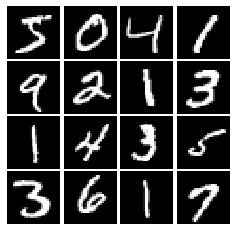

In [4]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [9]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [10]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [12]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [13]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [73]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256, input_shape=(784, )),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256, input_shape=(256, )),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1, input_shape=(1, ))
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [74]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [75]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim, )),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024, input_shape=(1024, )),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, input_shape=(1024, ), activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [76]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [78]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    l1 = tf.keras.losses.binary_crossentropy(tf.ones(logits_real.shape), logits_real, from_logits=True)
    l2 = tf.keras.losses.binary_crossentropy(tf.zeros(logits_fake.shape), logits_fake, from_logits=True)
    
    loss = tf.reduce_mean(l1) + tf.reduce_mean(l2)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones(logits_fake.shape), logits_fake, from_logits=True))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [79]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [80]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [66]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    G_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [81]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.552, G:0.6721


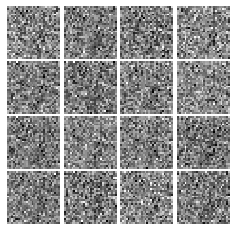

Epoch: 0, Iter: 20, D: 0.5902, G:0.9304


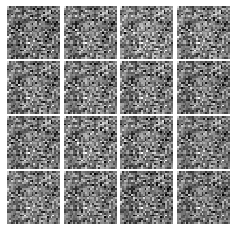

Epoch: 0, Iter: 40, D: 0.4844, G:1.148


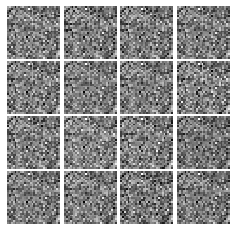

Epoch: 0, Iter: 60, D: 0.1882, G:2.556


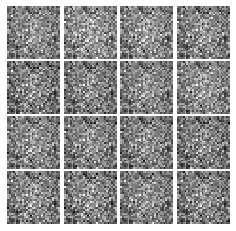

Epoch: 0, Iter: 80, D: 1.035, G:1.819


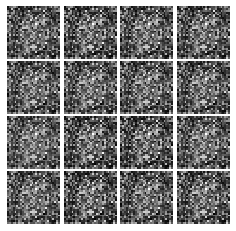

Epoch: 0, Iter: 100, D: 1.556, G:1.18


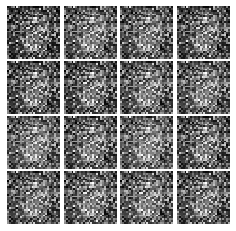

Epoch: 0, Iter: 120, D: 1.454, G:0.8622


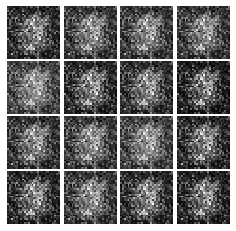

Epoch: 0, Iter: 140, D: 1.553, G:0.9655


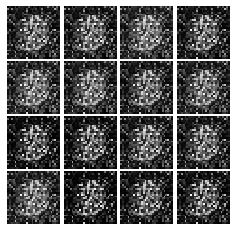

Epoch: 0, Iter: 160, D: 1.531, G:1.248


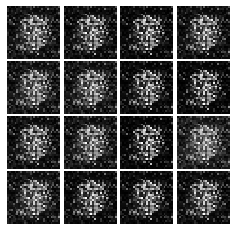

Epoch: 0, Iter: 180, D: 1.563, G:1.507


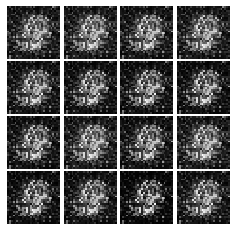

Epoch: 0, Iter: 200, D: 1.268, G:1.187


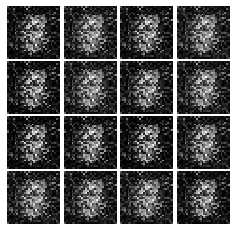

Epoch: 0, Iter: 220, D: 1.672, G:1.264


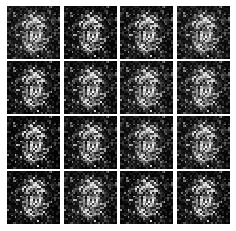

Epoch: 0, Iter: 240, D: 1.828, G:1.235


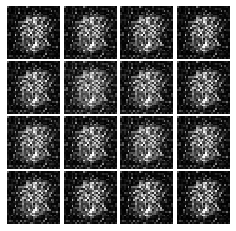

Epoch: 0, Iter: 260, D: 1.12, G:1.218


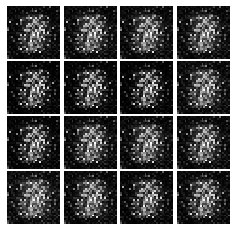

Epoch: 0, Iter: 280, D: 1.318, G:0.9391


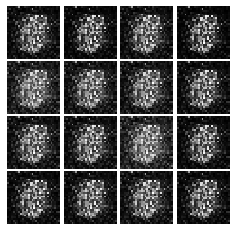

Epoch: 0, Iter: 300, D: 1.821, G:1.793


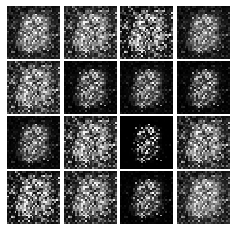

Epoch: 0, Iter: 320, D: 1.837, G:2.278


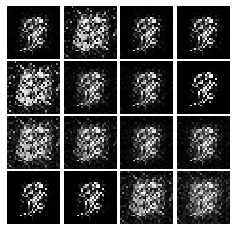

Epoch: 0, Iter: 340, D: 1.483, G:1.023


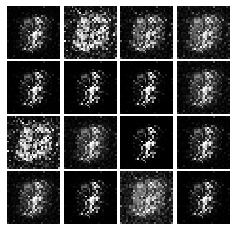

Epoch: 0, Iter: 360, D: 1.473, G:1.146


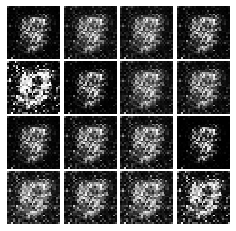

Epoch: 0, Iter: 380, D: 1.06, G:0.7994


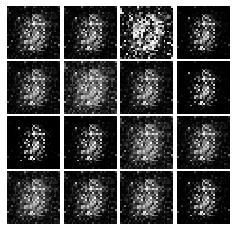

Epoch: 0, Iter: 400, D: 0.9146, G:1.414


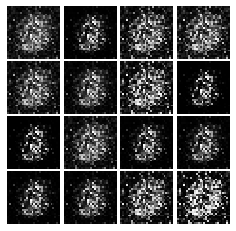

Epoch: 0, Iter: 420, D: 1.425, G:0.9612


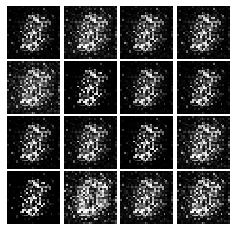

Epoch: 0, Iter: 440, D: 1.513, G:0.8968


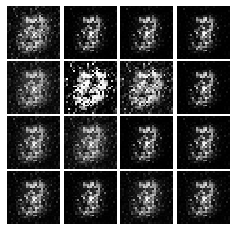

Epoch: 0, Iter: 460, D: 0.8116, G:1.599


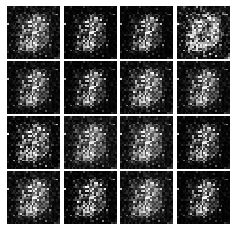

Epoch: 1, Iter: 480, D: 0.9662, G:0.7578


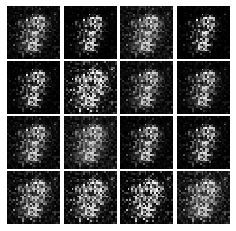

Epoch: 1, Iter: 500, D: 1.061, G:1.665


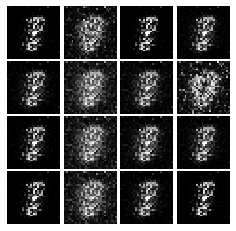

Epoch: 1, Iter: 520, D: 1.35, G:0.8586


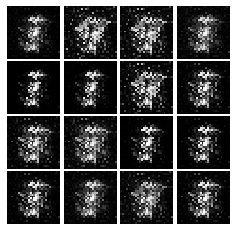

Epoch: 1, Iter: 540, D: 1.417, G:1.123


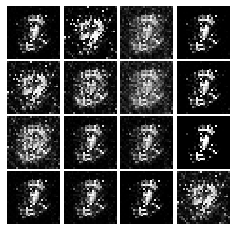

Epoch: 1, Iter: 560, D: 1.274, G:0.4897


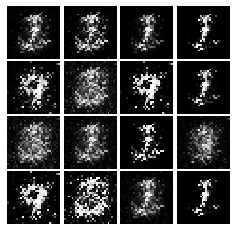

Epoch: 1, Iter: 580, D: 1.184, G:2.297


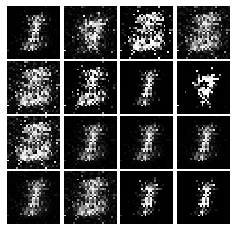

Epoch: 1, Iter: 600, D: 1.497, G:1.121


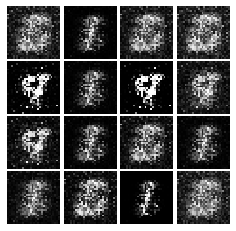

Epoch: 1, Iter: 620, D: 3.088, G:0.738


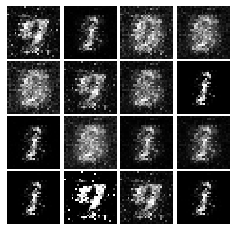

Epoch: 1, Iter: 640, D: 1.057, G:1.073


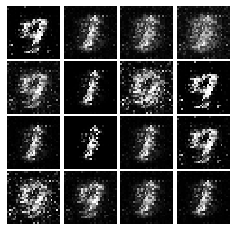

Epoch: 1, Iter: 660, D: 1.277, G:1.027


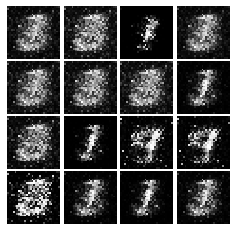

Epoch: 1, Iter: 680, D: 1.076, G:1.541


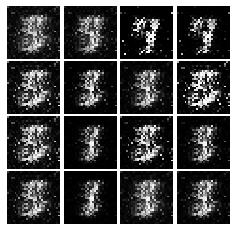

Epoch: 1, Iter: 700, D: 1.071, G:1.417


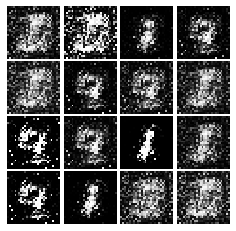

Epoch: 1, Iter: 720, D: 0.8584, G:1.359


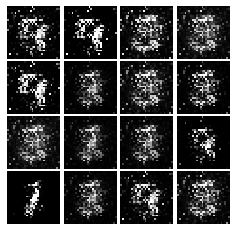

Epoch: 1, Iter: 740, D: 0.9805, G:1.568


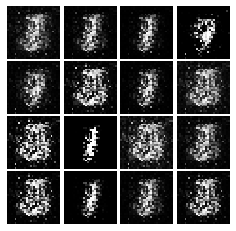

Epoch: 1, Iter: 760, D: 2.127, G:1.262


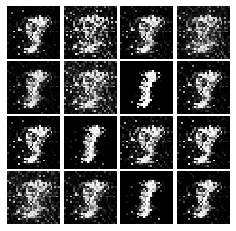

Epoch: 1, Iter: 780, D: 1.139, G:1.197


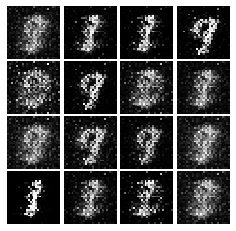

Epoch: 1, Iter: 800, D: 1.065, G:1.379


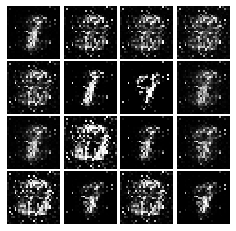

Epoch: 1, Iter: 820, D: 1.43, G:2.152


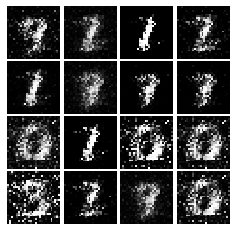

Epoch: 1, Iter: 840, D: 1.651, G:0.9059


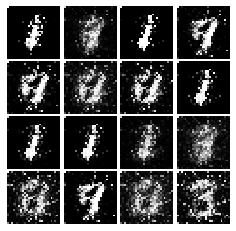

Epoch: 1, Iter: 860, D: 1.27, G:0.8655


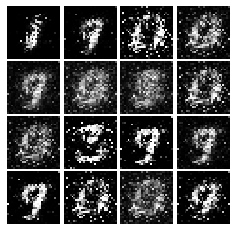

Epoch: 1, Iter: 880, D: 1.255, G:1.075


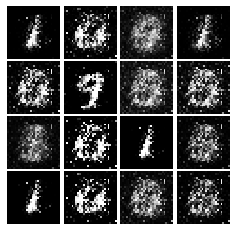

Epoch: 1, Iter: 900, D: 1.165, G:0.9939


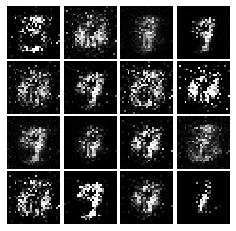

Epoch: 1, Iter: 920, D: 1.31, G:0.7248


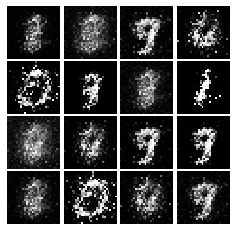

Epoch: 2, Iter: 940, D: 1.041, G:0.9933


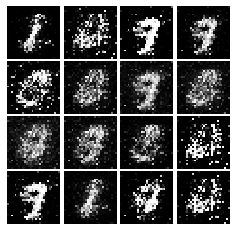

Epoch: 2, Iter: 960, D: 0.9602, G:1.094


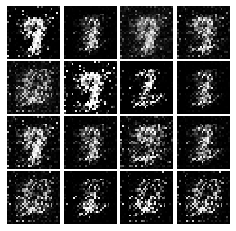

Epoch: 2, Iter: 980, D: 1.147, G:2.338


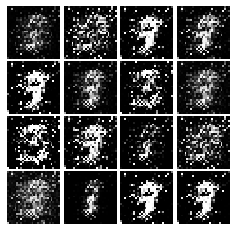

Epoch: 2, Iter: 1000, D: 1.176, G:1.352


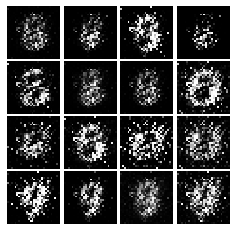

Epoch: 2, Iter: 1020, D: 1.114, G:1.811


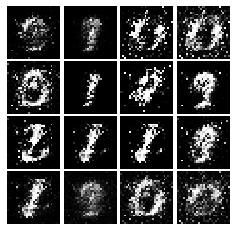

Epoch: 2, Iter: 1040, D: 1.099, G:1.336


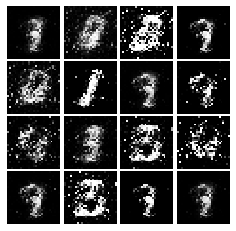

Epoch: 2, Iter: 1060, D: 1.393, G:0.5855


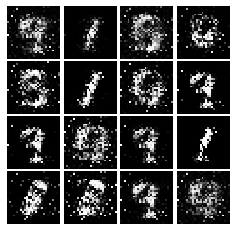

Epoch: 2, Iter: 1080, D: 1.223, G:1.162


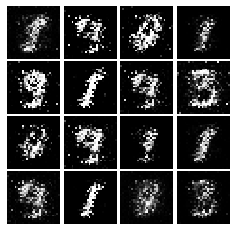

Epoch: 2, Iter: 1100, D: 1.281, G:1.073


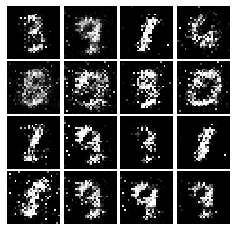

Epoch: 2, Iter: 1120, D: 1.359, G:1.018


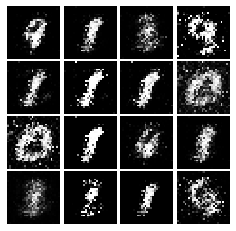

Epoch: 2, Iter: 1140, D: 1.599, G:1.126


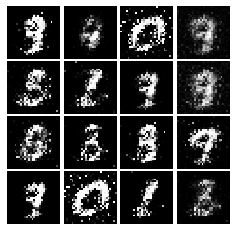

Epoch: 2, Iter: 1160, D: 1.353, G:0.7911


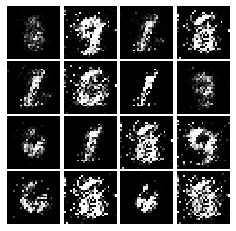

Epoch: 2, Iter: 1180, D: 1.222, G:1.041


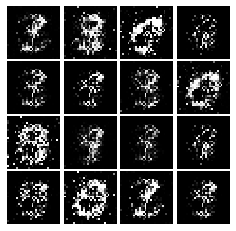

Epoch: 2, Iter: 1200, D: 1.25, G:0.8846


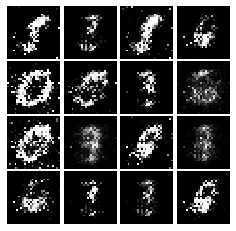

Epoch: 2, Iter: 1220, D: 1.242, G:0.772


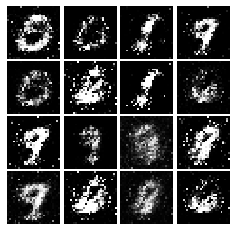

Epoch: 2, Iter: 1240, D: 1.165, G:0.8527


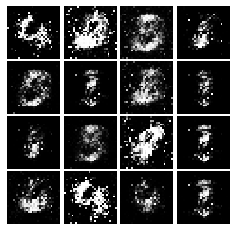

Epoch: 2, Iter: 1260, D: 1.253, G:0.9332


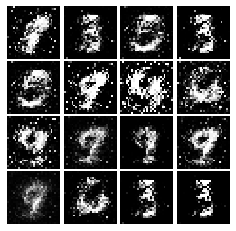

Epoch: 2, Iter: 1280, D: 1.231, G:0.9783


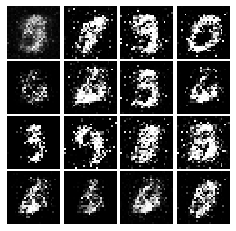

Epoch: 2, Iter: 1300, D: 1.227, G:0.8234


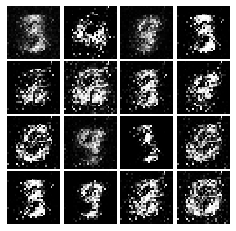

Epoch: 2, Iter: 1320, D: 1.37, G:0.9316


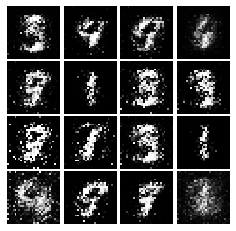

Epoch: 2, Iter: 1340, D: 1.457, G:0.8431


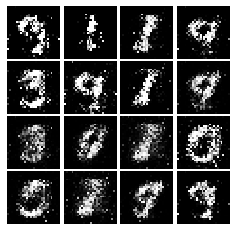

Epoch: 2, Iter: 1360, D: 1.247, G:0.849


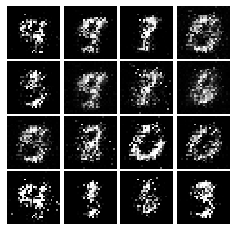

Epoch: 2, Iter: 1380, D: 1.147, G:1.153


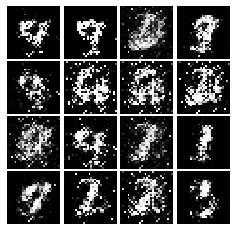

Epoch: 2, Iter: 1400, D: 1.336, G:1.046


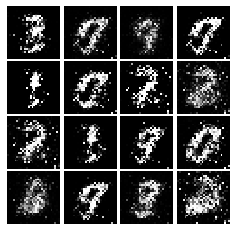

Epoch: 3, Iter: 1420, D: 1.697, G:0.9101


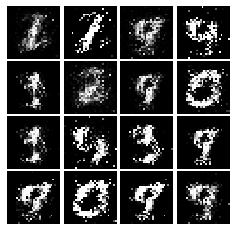

Epoch: 3, Iter: 1440, D: 1.227, G:1.16


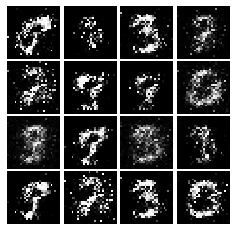

Epoch: 3, Iter: 1460, D: 1.25, G:1.058


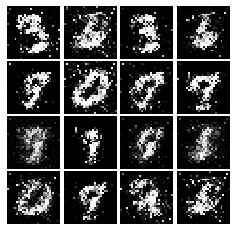

Epoch: 3, Iter: 1480, D: 1.181, G:0.9366


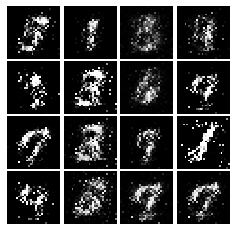

Epoch: 3, Iter: 1500, D: 1.285, G:0.9481


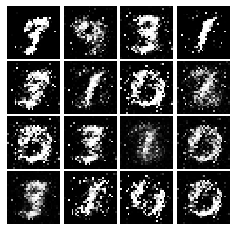

Epoch: 3, Iter: 1520, D: 1.196, G:2.32


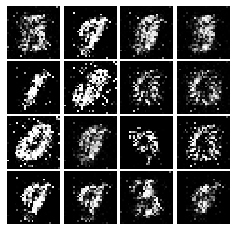

Epoch: 3, Iter: 1540, D: 1.323, G:0.9838


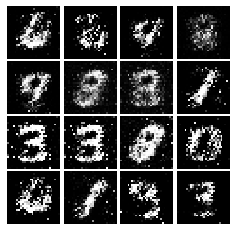

Epoch: 3, Iter: 1560, D: 1.244, G:1.212


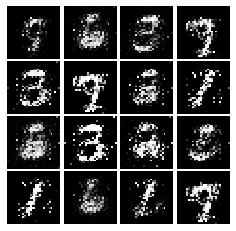

Epoch: 3, Iter: 1580, D: 1.31, G:0.9481


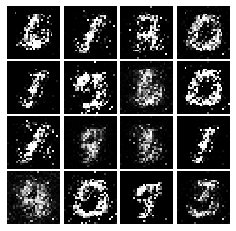

Epoch: 3, Iter: 1600, D: 1.209, G:1.15


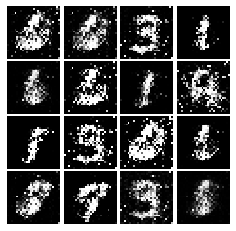

Epoch: 3, Iter: 1620, D: 1.225, G:0.9842


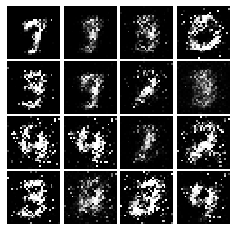

Epoch: 3, Iter: 1640, D: 1.353, G:1.378


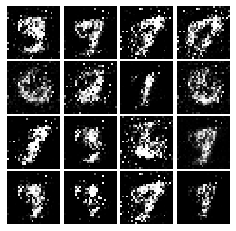

Epoch: 3, Iter: 1660, D: 1.057, G:1.315


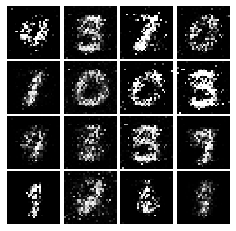

Epoch: 3, Iter: 1680, D: 1.176, G:1.096


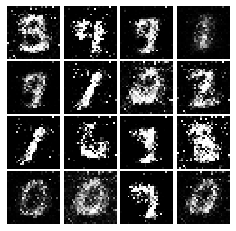

Epoch: 3, Iter: 1700, D: 1.359, G:0.8686


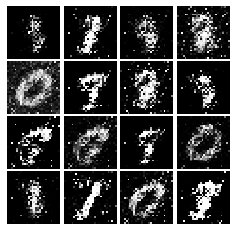

Epoch: 3, Iter: 1720, D: 1.558, G:2.304


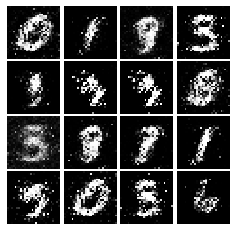

Epoch: 3, Iter: 1740, D: 1.124, G:0.8919


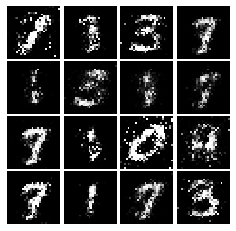

Epoch: 3, Iter: 1760, D: 1.226, G:0.9725


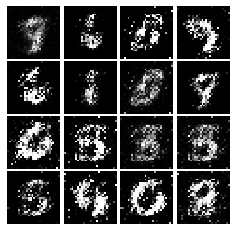

Epoch: 3, Iter: 1780, D: 1.327, G:0.7949


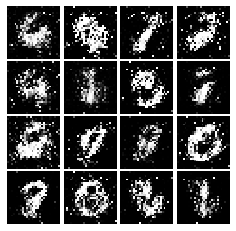

Epoch: 3, Iter: 1800, D: 1.25, G:1.207


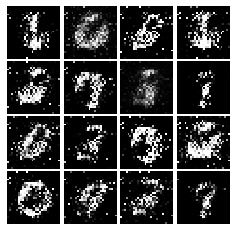

Epoch: 3, Iter: 1820, D: 1.058, G:1.57


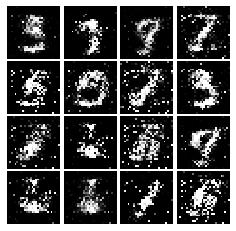

Epoch: 3, Iter: 1840, D: 1.063, G:2.192


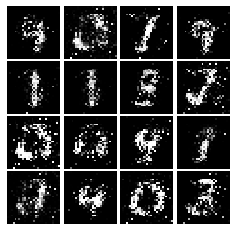

Epoch: 3, Iter: 1860, D: 1.199, G:0.9582


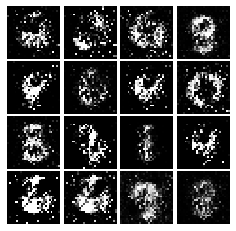

Epoch: 4, Iter: 1880, D: 1.193, G:1.098


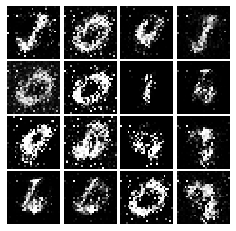

Epoch: 4, Iter: 1900, D: 1.212, G:1.052


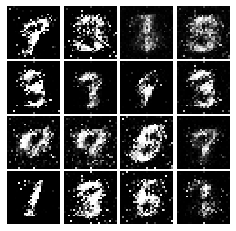

Epoch: 4, Iter: 1920, D: 1.224, G:0.9852


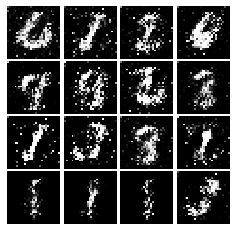

Epoch: 4, Iter: 1940, D: 1.293, G:0.9593


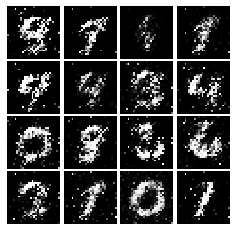

Epoch: 4, Iter: 1960, D: 1.291, G:1.065


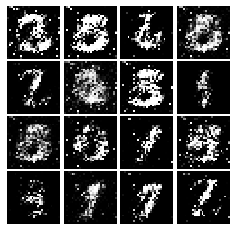

Epoch: 4, Iter: 1980, D: 1.225, G:0.8916


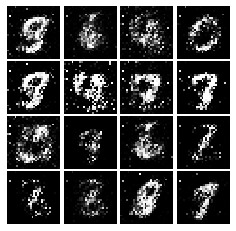

Epoch: 4, Iter: 2000, D: 1.259, G:0.8556


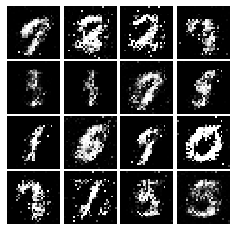

Epoch: 4, Iter: 2020, D: 1.291, G:0.7903


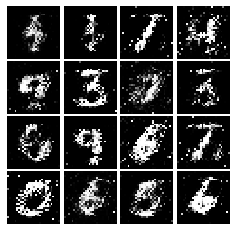

Epoch: 4, Iter: 2040, D: 1.311, G:0.8978


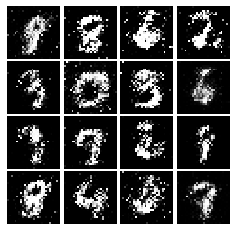

Epoch: 4, Iter: 2060, D: 1.233, G:1.162


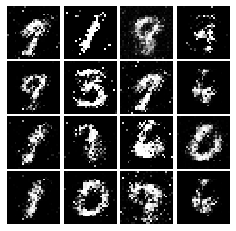

Epoch: 4, Iter: 2080, D: 1.296, G:0.8348


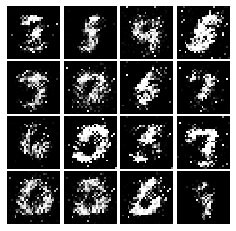

Epoch: 4, Iter: 2100, D: 1.226, G:0.9195


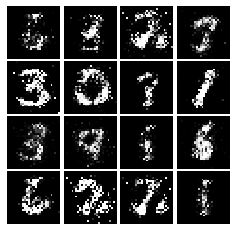

Epoch: 4, Iter: 2120, D: 1.211, G:0.8147


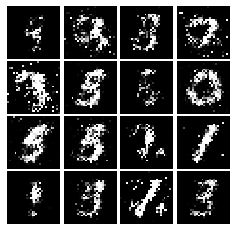

Epoch: 4, Iter: 2140, D: 1.485, G:0.4984


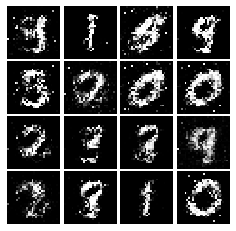

Epoch: 4, Iter: 2160, D: 1.377, G:0.8406


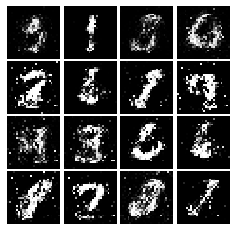

Epoch: 4, Iter: 2180, D: 1.335, G:0.8624


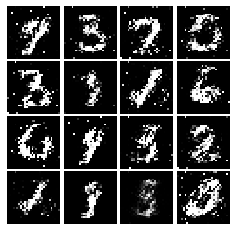

Epoch: 4, Iter: 2200, D: 1.275, G:0.8346


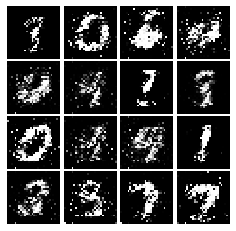

Epoch: 4, Iter: 2220, D: 1.296, G:0.8648


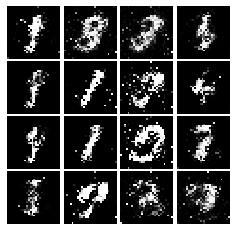

Epoch: 4, Iter: 2240, D: 1.241, G:0.9667


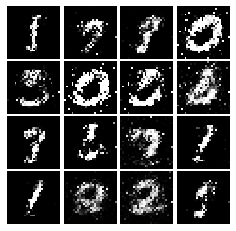

Epoch: 4, Iter: 2260, D: 1.206, G:0.9405


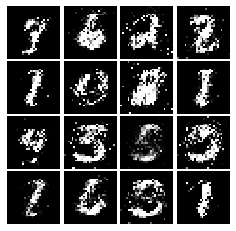

Epoch: 4, Iter: 2280, D: 1.228, G:0.9714


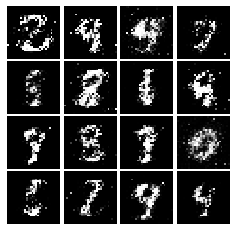

Epoch: 4, Iter: 2300, D: 2.052, G:0.7742


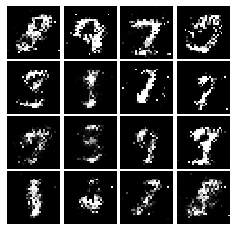

Epoch: 4, Iter: 2320, D: 1.328, G:1.03


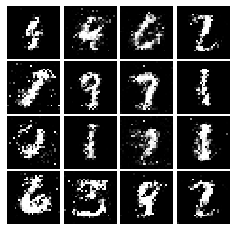

Epoch: 4, Iter: 2340, D: 1.386, G:0.7781


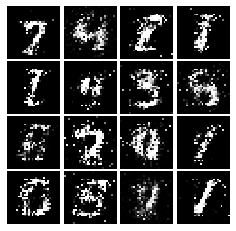

Epoch: 5, Iter: 2360, D: 1.251, G:0.9445


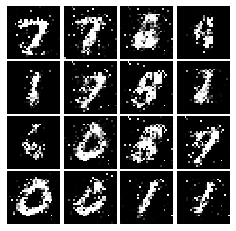

Epoch: 5, Iter: 2380, D: 1.335, G:1.016


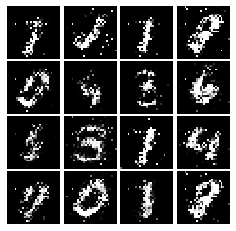

Epoch: 5, Iter: 2400, D: 1.238, G:0.8319


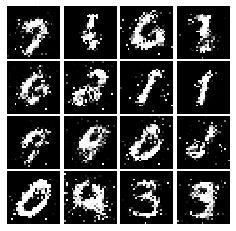

Epoch: 5, Iter: 2420, D: 1.289, G:0.8659


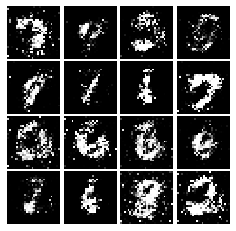

Epoch: 5, Iter: 2440, D: 1.242, G:0.9213


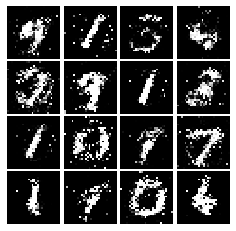

Epoch: 5, Iter: 2460, D: 1.166, G:1.079


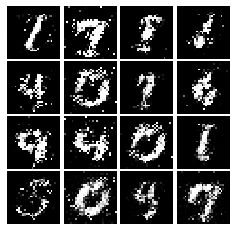

Epoch: 5, Iter: 2480, D: 1.309, G:1.013


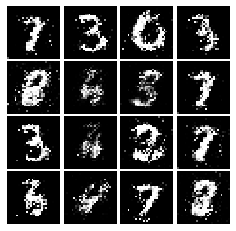

Epoch: 5, Iter: 2500, D: 1.234, G:0.9092


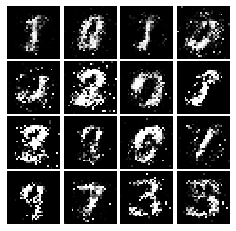

Epoch: 5, Iter: 2520, D: 1.301, G:0.8408


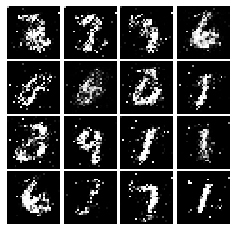

Epoch: 5, Iter: 2540, D: 1.224, G:0.9464


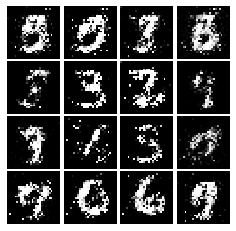

Epoch: 5, Iter: 2560, D: 1.277, G:1.008


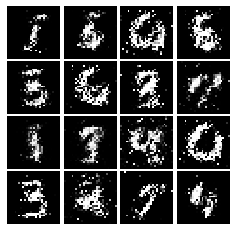

Epoch: 5, Iter: 2580, D: 1.175, G:1.236


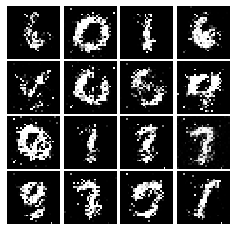

Epoch: 5, Iter: 2600, D: 1.269, G:0.7037


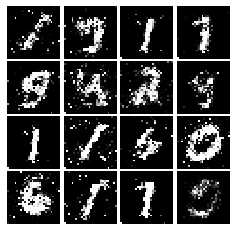

Epoch: 5, Iter: 2620, D: 1.313, G:1.071


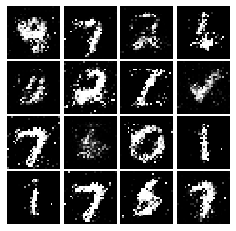

Epoch: 5, Iter: 2640, D: 1.366, G:0.9463


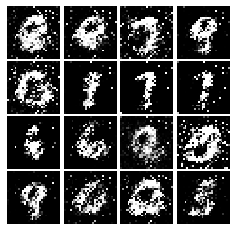

Epoch: 5, Iter: 2660, D: 1.224, G:0.981


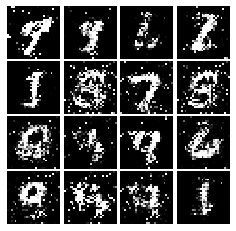

Epoch: 5, Iter: 2680, D: 1.295, G:1.059


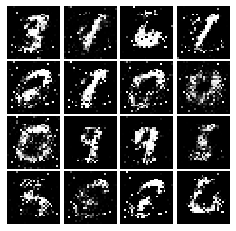

Epoch: 5, Iter: 2700, D: 1.313, G:0.8146


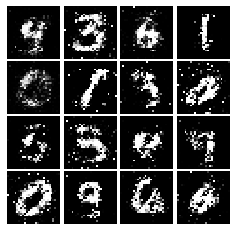

Epoch: 5, Iter: 2720, D: 1.304, G:1.01


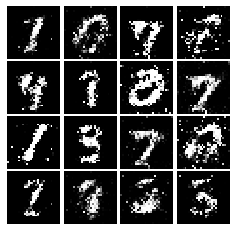

Epoch: 5, Iter: 2740, D: 1.395, G:0.8087


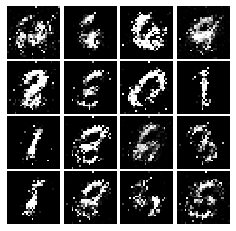

Epoch: 5, Iter: 2760, D: 1.347, G:0.8526


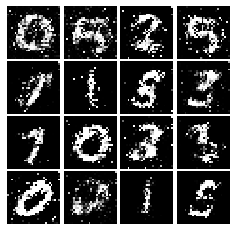

Epoch: 5, Iter: 2780, D: 1.304, G:0.9364


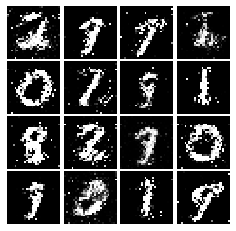

Epoch: 5, Iter: 2800, D: 1.347, G:0.8223


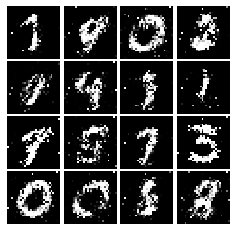

Epoch: 6, Iter: 2820, D: 1.359, G:0.8425


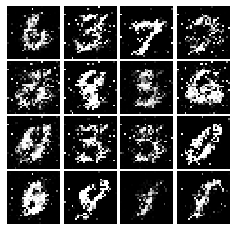

Epoch: 6, Iter: 2840, D: 1.291, G:0.8103


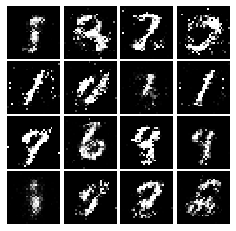

Epoch: 6, Iter: 2860, D: 1.304, G:0.8704


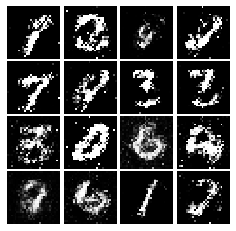

Epoch: 6, Iter: 2880, D: 1.23, G:0.8196


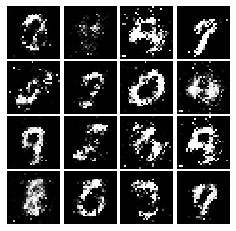

Epoch: 6, Iter: 2900, D: 1.263, G:0.8037


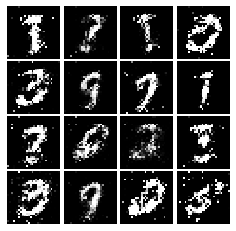

Epoch: 6, Iter: 2920, D: 1.284, G:0.8942


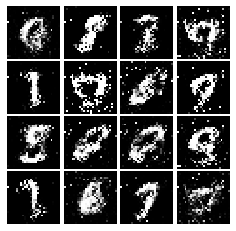

Epoch: 6, Iter: 2940, D: 1.199, G:0.8623


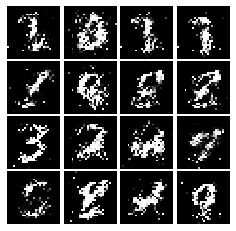

Epoch: 6, Iter: 2960, D: 1.283, G:0.8822


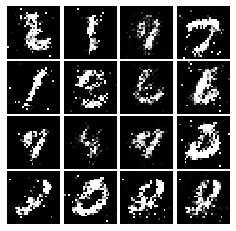

Epoch: 6, Iter: 2980, D: 1.238, G:0.7858


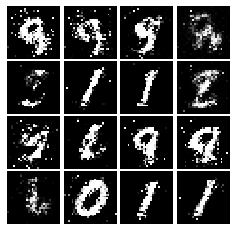

Epoch: 6, Iter: 3000, D: 1.266, G:0.936


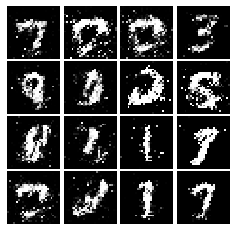

Epoch: 6, Iter: 3020, D: 1.4, G:0.9027


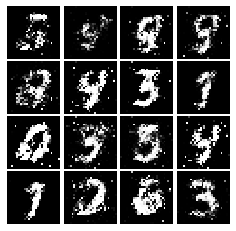

Epoch: 6, Iter: 3040, D: 1.37, G:0.9065


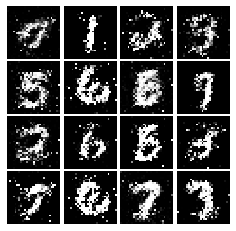

Epoch: 6, Iter: 3060, D: 1.315, G:0.7408


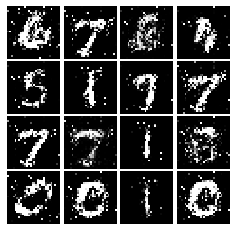

Epoch: 6, Iter: 3080, D: 1.309, G:0.8763


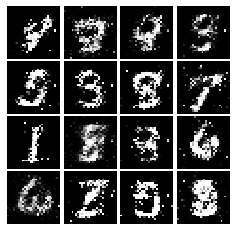

Epoch: 6, Iter: 3100, D: 1.402, G:0.8657


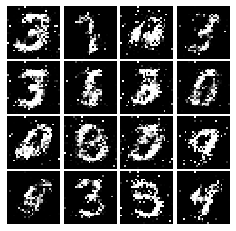

Epoch: 6, Iter: 3120, D: 1.395, G:0.8052


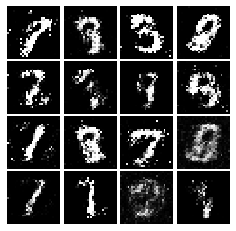

Epoch: 6, Iter: 3140, D: 1.375, G:0.8574


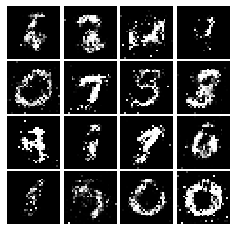

Epoch: 6, Iter: 3160, D: 1.264, G:0.9207


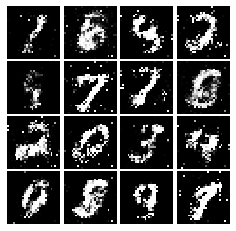

Epoch: 6, Iter: 3180, D: 1.259, G:0.8985


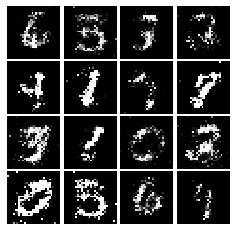

Epoch: 6, Iter: 3200, D: 1.278, G:0.9239


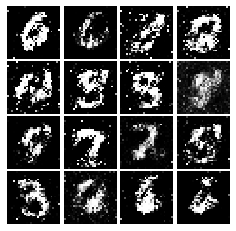

Epoch: 6, Iter: 3220, D: 1.391, G:0.8178


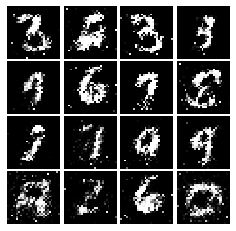

Epoch: 6, Iter: 3240, D: 1.274, G:0.9278


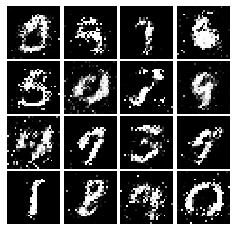

Epoch: 6, Iter: 3260, D: 1.417, G:0.8209


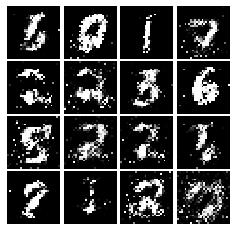

Epoch: 6, Iter: 3280, D: 1.307, G:0.8478


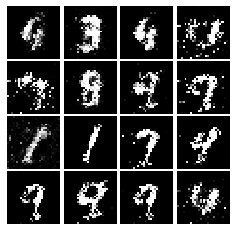

Epoch: 7, Iter: 3300, D: 1.193, G:0.9174


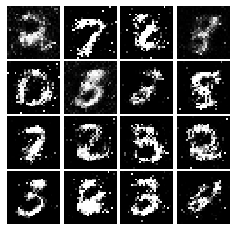

Epoch: 7, Iter: 3320, D: 1.286, G:0.8219


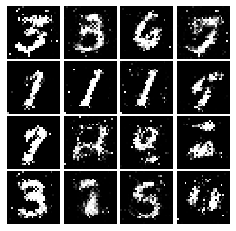

Epoch: 7, Iter: 3340, D: 1.286, G:0.8326


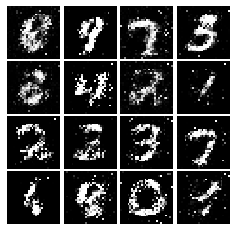

Epoch: 7, Iter: 3360, D: 1.407, G:0.8127


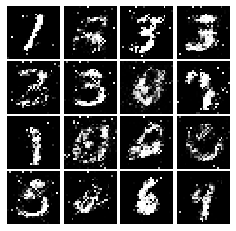

Epoch: 7, Iter: 3380, D: 1.273, G:0.7877


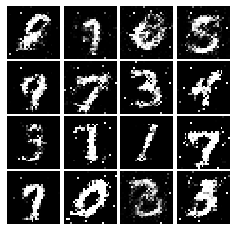

Epoch: 7, Iter: 3400, D: 1.388, G:0.9333


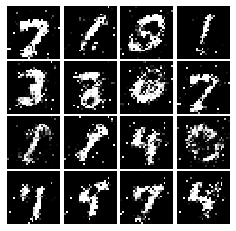

Epoch: 7, Iter: 3420, D: 1.318, G:0.839


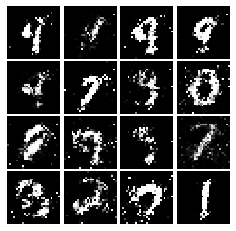

Epoch: 7, Iter: 3440, D: 1.196, G:0.989


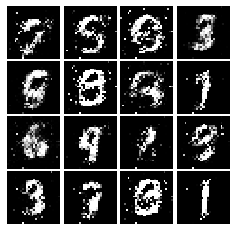

Epoch: 7, Iter: 3460, D: 1.312, G:0.8751


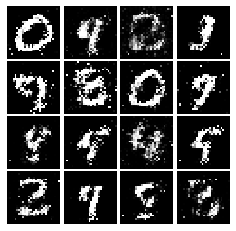

Epoch: 7, Iter: 3480, D: 1.258, G:0.8389


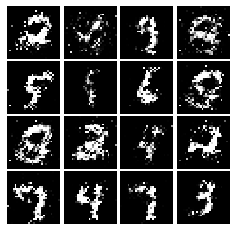

Epoch: 7, Iter: 3500, D: 1.322, G:0.8941


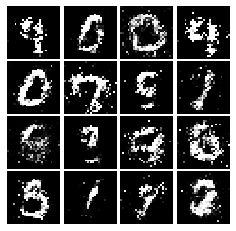

Epoch: 7, Iter: 3520, D: 1.332, G:0.786


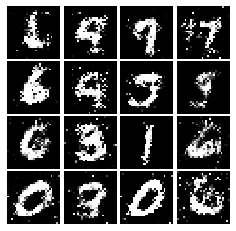

Epoch: 7, Iter: 3540, D: 1.248, G:0.8494


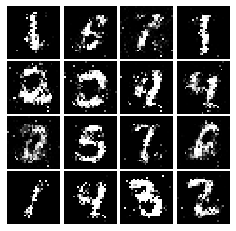

Epoch: 7, Iter: 3560, D: 1.272, G:0.8327


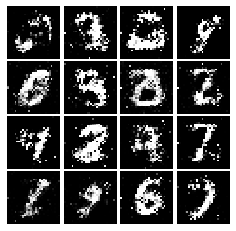

Epoch: 7, Iter: 3580, D: 1.317, G:0.9272


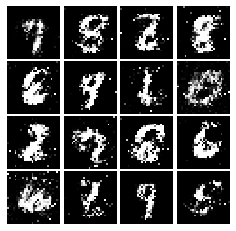

Epoch: 7, Iter: 3600, D: 1.348, G:0.8203


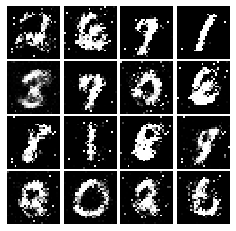

Epoch: 7, Iter: 3620, D: 1.302, G:0.7473


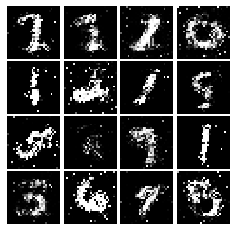

Epoch: 7, Iter: 3640, D: 1.318, G:0.8063


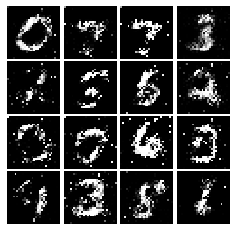

Epoch: 7, Iter: 3660, D: 1.215, G:0.894


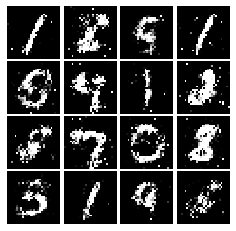

Epoch: 7, Iter: 3680, D: 1.283, G:0.8588


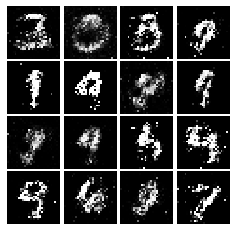

Epoch: 7, Iter: 3700, D: 1.398, G:0.7896


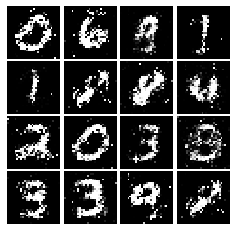

Epoch: 7, Iter: 3720, D: 1.372, G:0.8262


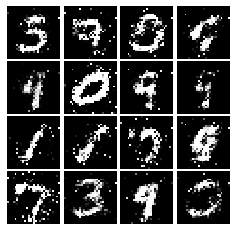

Epoch: 7, Iter: 3740, D: 1.344, G:0.7987


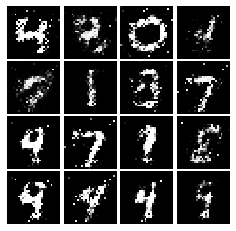

Epoch: 8, Iter: 3760, D: 1.41, G:0.7842


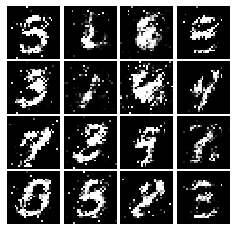

Epoch: 8, Iter: 3780, D: 1.512, G:0.671


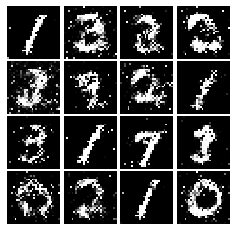

Epoch: 8, Iter: 3800, D: 1.386, G:0.7479


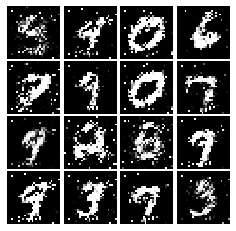

Epoch: 8, Iter: 3820, D: 1.332, G:0.8548


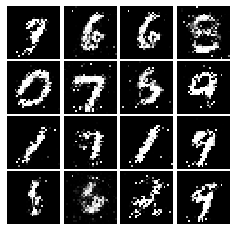

Epoch: 8, Iter: 3840, D: 1.259, G:0.8051


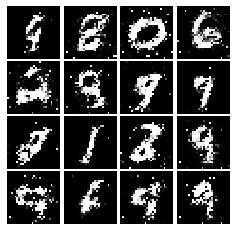

Epoch: 8, Iter: 3860, D: 1.306, G:0.812


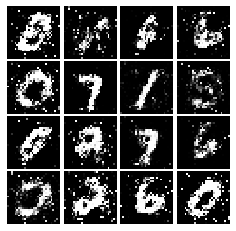

Epoch: 8, Iter: 3880, D: 1.391, G:0.6857


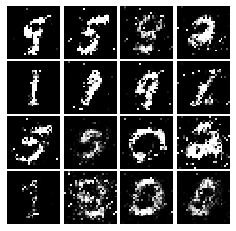

Epoch: 8, Iter: 3900, D: 1.35, G:0.7867


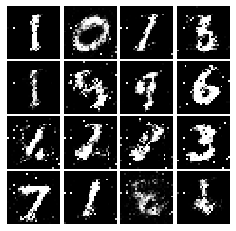

Epoch: 8, Iter: 3920, D: 1.301, G:0.8479


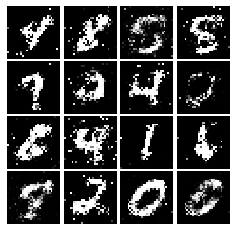

Epoch: 8, Iter: 3940, D: 1.376, G:0.8391


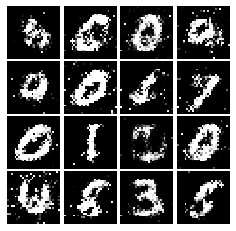

Epoch: 8, Iter: 3960, D: 1.454, G:0.8628


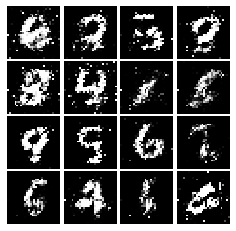

Epoch: 8, Iter: 3980, D: 1.28, G:0.7913


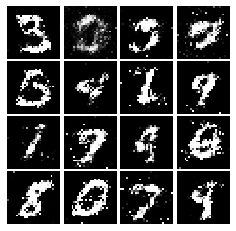

Epoch: 8, Iter: 4000, D: 1.34, G:0.7193


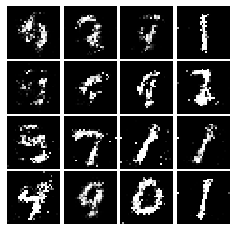

Epoch: 8, Iter: 4020, D: 1.407, G:0.7695


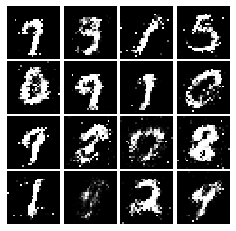

Epoch: 8, Iter: 4040, D: 1.256, G:0.831


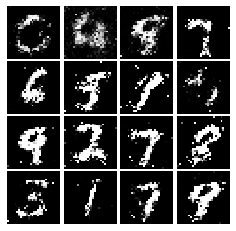

Epoch: 8, Iter: 4060, D: 1.37, G:0.7626


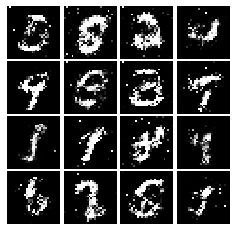

Epoch: 8, Iter: 4080, D: 1.331, G:0.7426


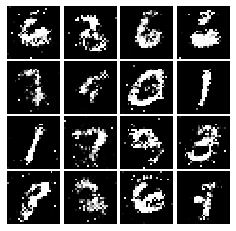

Epoch: 8, Iter: 4100, D: 1.332, G:0.7809


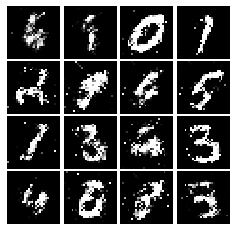

Epoch: 8, Iter: 4120, D: 1.38, G:0.7279


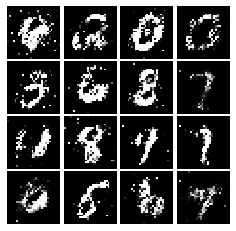

Epoch: 8, Iter: 4140, D: 1.313, G:0.8279


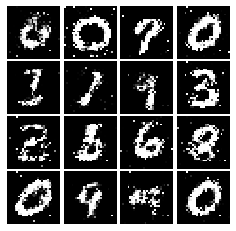

Epoch: 8, Iter: 4160, D: 1.42, G:0.8441


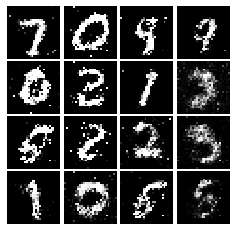

Epoch: 8, Iter: 4180, D: 1.363, G:0.9058


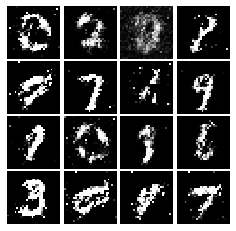

Epoch: 8, Iter: 4200, D: 1.4, G:0.7669


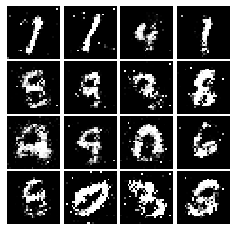

Epoch: 8, Iter: 4220, D: 1.378, G:0.798


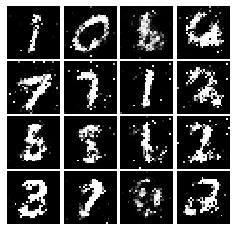

Epoch: 9, Iter: 4240, D: 1.332, G:0.7807


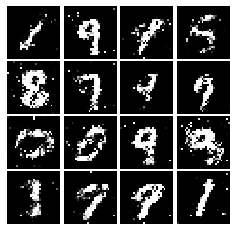

Epoch: 9, Iter: 4260, D: 1.357, G:0.6764


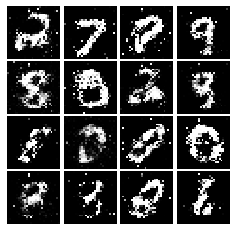

Epoch: 9, Iter: 4280, D: 1.492, G:0.8791


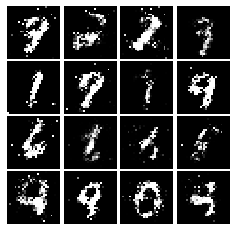

Epoch: 9, Iter: 4300, D: 1.49, G:0.8615


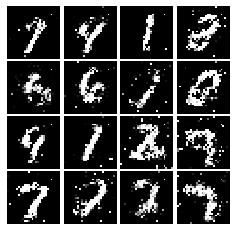

Epoch: 9, Iter: 4320, D: 1.338, G:0.7864


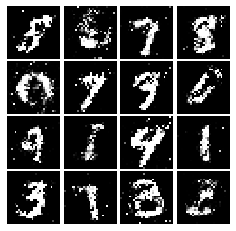

Epoch: 9, Iter: 4340, D: 1.445, G:0.8253


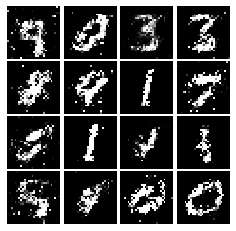

Epoch: 9, Iter: 4360, D: 1.348, G:0.7227


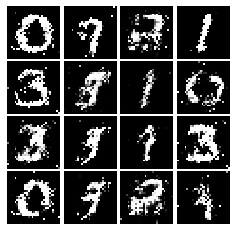

Epoch: 9, Iter: 4380, D: 1.427, G:0.7796


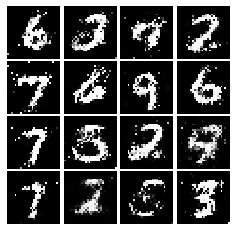

Epoch: 9, Iter: 4400, D: 1.345, G:0.7979


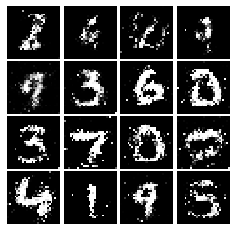

Epoch: 9, Iter: 4420, D: 1.39, G:0.8845


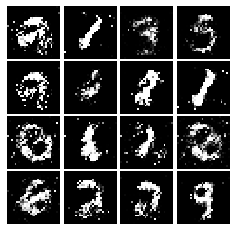

Epoch: 9, Iter: 4440, D: 1.259, G:0.7382


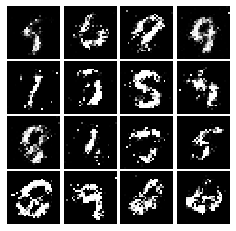

Epoch: 9, Iter: 4460, D: 1.362, G:0.7549


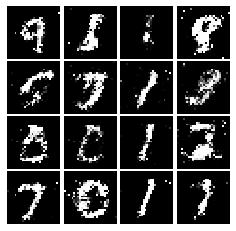

Epoch: 9, Iter: 4480, D: 1.393, G:0.7608


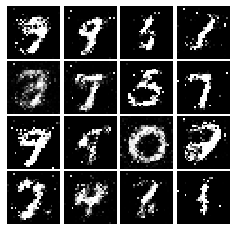

Epoch: 9, Iter: 4500, D: 1.496, G:0.8392


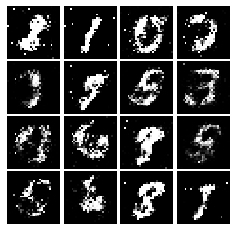

Epoch: 9, Iter: 4520, D: 1.414, G:0.7679


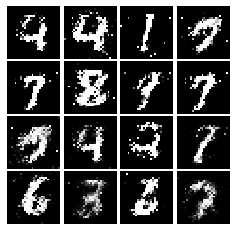

Epoch: 9, Iter: 4540, D: 1.429, G:0.8115


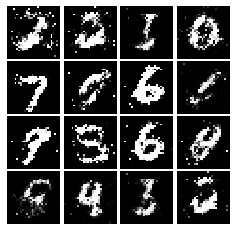

Epoch: 9, Iter: 4560, D: 1.361, G:0.9846


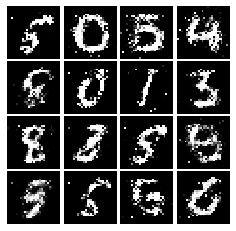

Epoch: 9, Iter: 4580, D: 1.341, G:0.7977


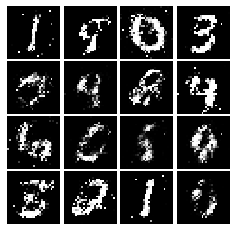

Epoch: 9, Iter: 4600, D: 1.363, G:0.8436


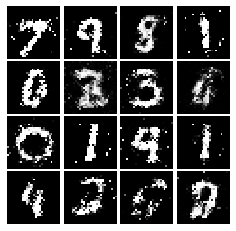

Epoch: 9, Iter: 4620, D: 1.363, G:0.7581


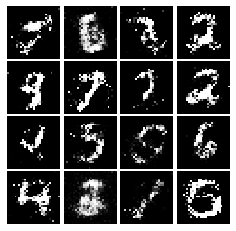

Epoch: 9, Iter: 4640, D: 1.372, G:0.9138


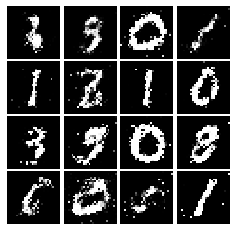

Epoch: 9, Iter: 4660, D: 1.415, G:0.7349


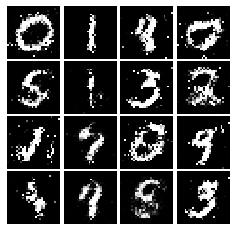

Epoch: 9, Iter: 4680, D: 1.312, G:0.8834


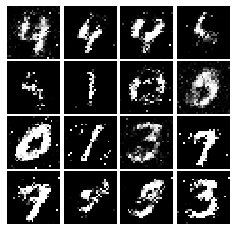

Final images


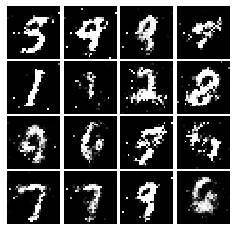

In [82]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [83]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    l1 = tf.reduce_mean((scores_real - 1) ** 2) * 0.5
    l2 = tf.reduce_mean(scores_fake ** 2) * 0.5
    
    loss = l1 + l2
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = tf.reduce_mean((scores_fake - 1) ** 2) * 0.5

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [84]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.65, G:0.3853


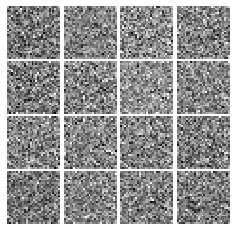

Epoch: 0, Iter: 20, D: 0.114, G:1.216


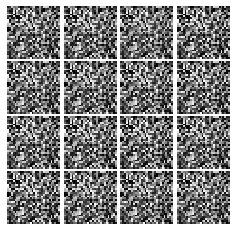

Epoch: 0, Iter: 40, D: 0.01676, G:0.6931


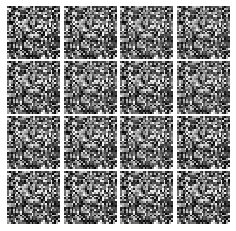

Epoch: 0, Iter: 60, D: 0.02546, G:0.557


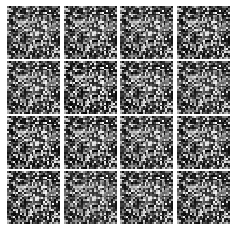

Epoch: 0, Iter: 80, D: 0.2309, G:0.9483


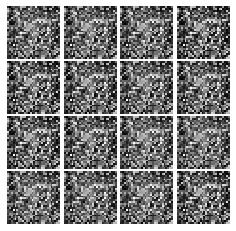

Epoch: 0, Iter: 100, D: 0.0221, G:0.6726


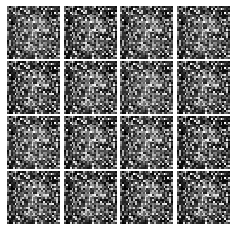

Epoch: 0, Iter: 120, D: 0.02207, G:0.6599


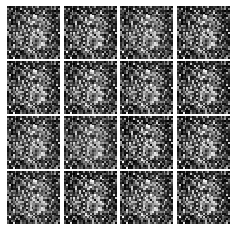

Epoch: 0, Iter: 140, D: 0.1089, G:0.4928


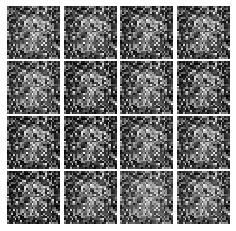

Epoch: 0, Iter: 160, D: 0.2223, G:0.2433


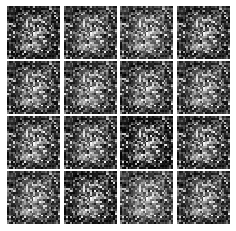

Epoch: 0, Iter: 180, D: 0.4978, G:2.119


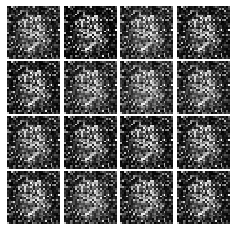

Epoch: 0, Iter: 200, D: 0.09956, G:0.3538


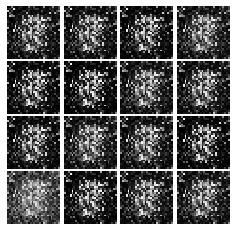

Epoch: 0, Iter: 220, D: 0.1876, G:0.7409


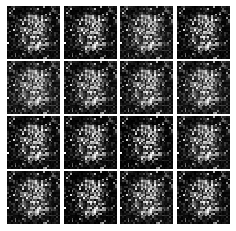

Epoch: 0, Iter: 240, D: 0.136, G:0.6993


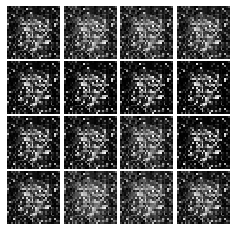

Epoch: 0, Iter: 260, D: 0.1123, G:0.4228


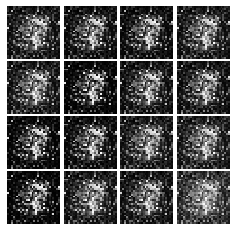

Epoch: 0, Iter: 280, D: 0.1774, G:0.4498


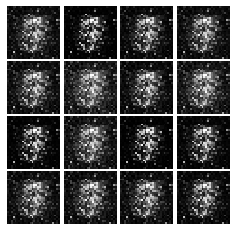

Epoch: 0, Iter: 300, D: 0.1621, G:0.2614


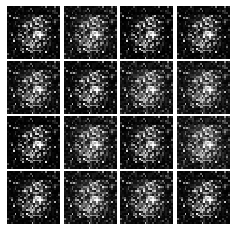

Epoch: 0, Iter: 320, D: 0.5421, G:1.425


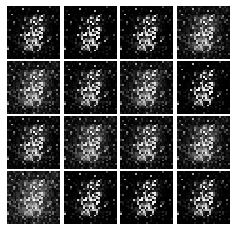

Epoch: 0, Iter: 340, D: 0.1312, G:0.3475


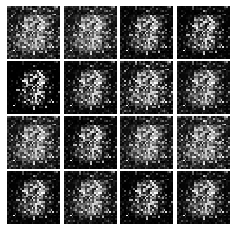

Epoch: 0, Iter: 360, D: 0.1668, G:0.4336


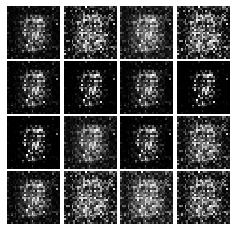

Epoch: 0, Iter: 380, D: 0.1878, G:0.3721


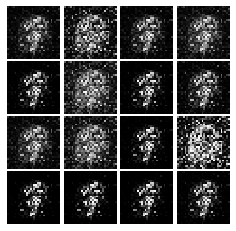

Epoch: 0, Iter: 400, D: 0.1554, G:0.4264


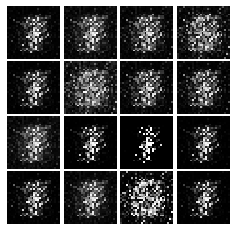

Epoch: 0, Iter: 420, D: 0.1386, G:0.4154


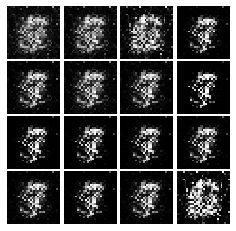

Epoch: 0, Iter: 440, D: 0.1128, G:0.321


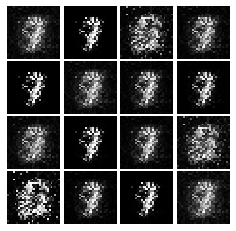

Epoch: 0, Iter: 460, D: 0.1057, G:0.5139


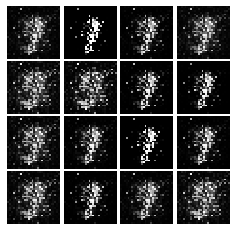

Epoch: 1, Iter: 480, D: 0.09734, G:0.4203


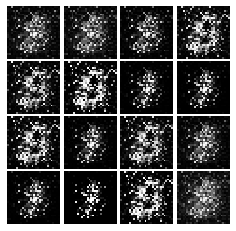

Epoch: 1, Iter: 500, D: 0.1308, G:0.4455


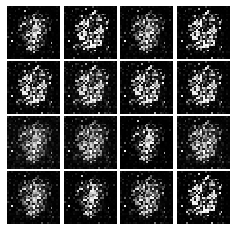

Epoch: 1, Iter: 520, D: 0.1106, G:0.4761


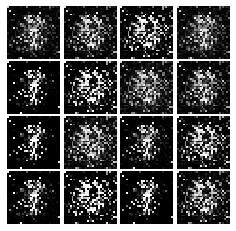

Epoch: 1, Iter: 540, D: 0.135, G:0.7177


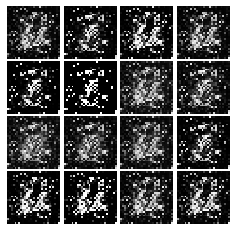

Epoch: 1, Iter: 560, D: 0.08791, G:0.4044


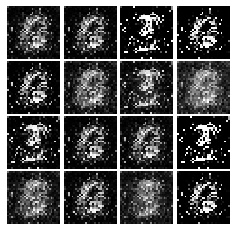

Epoch: 1, Iter: 580, D: 0.1298, G:0.5439


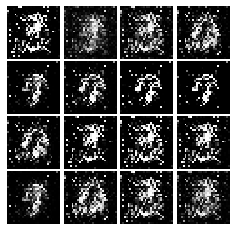

Epoch: 1, Iter: 600, D: 0.2431, G:0.6313


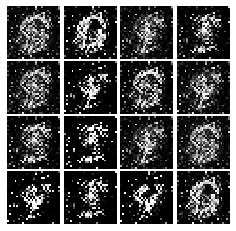

Epoch: 1, Iter: 620, D: 0.1505, G:0.8532


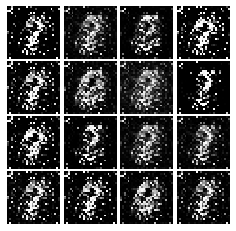

Epoch: 1, Iter: 640, D: 0.08412, G:0.447


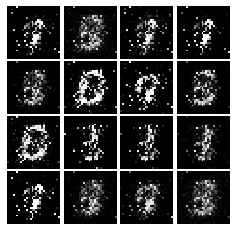

Epoch: 1, Iter: 660, D: 0.09777, G:0.4662


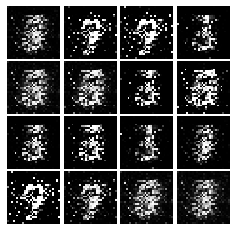

Epoch: 1, Iter: 680, D: 0.1715, G:0.2508


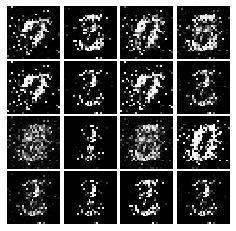

Epoch: 1, Iter: 700, D: 0.1046, G:0.658


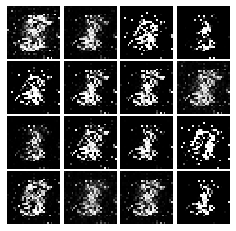

Epoch: 1, Iter: 720, D: 0.1388, G:0.4879


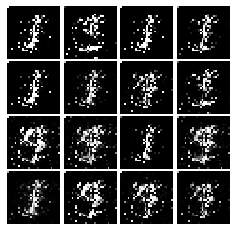

Epoch: 1, Iter: 740, D: 0.1439, G:0.3597


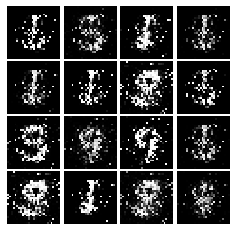

Epoch: 1, Iter: 760, D: 0.1397, G:0.5913


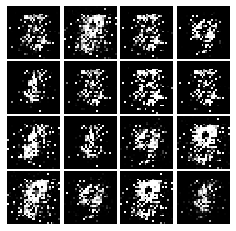

Epoch: 1, Iter: 780, D: 0.101, G:0.3821


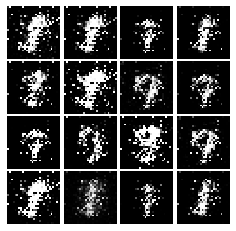

Epoch: 1, Iter: 800, D: 0.1404, G:0.3068


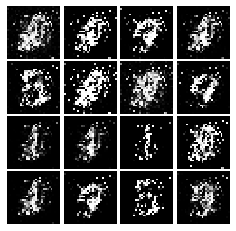

Epoch: 1, Iter: 820, D: 0.463, G:0.3011


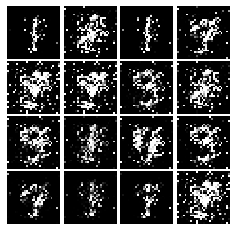

Epoch: 1, Iter: 840, D: 0.1579, G:0.2178


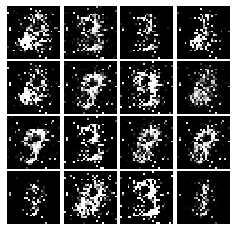

Epoch: 1, Iter: 860, D: 0.1044, G:0.3086


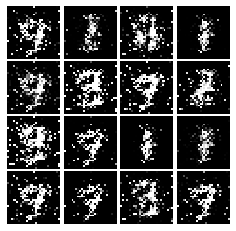

Epoch: 1, Iter: 880, D: 0.1382, G:0.3228


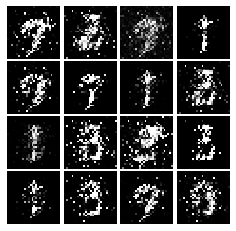

Epoch: 1, Iter: 900, D: 0.08611, G:0.4819


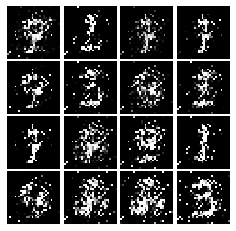

Epoch: 1, Iter: 920, D: 0.1643, G:0.3833


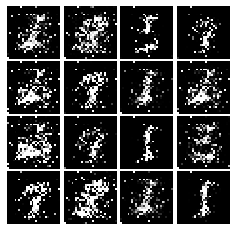

Epoch: 2, Iter: 940, D: 0.1919, G:0.3201


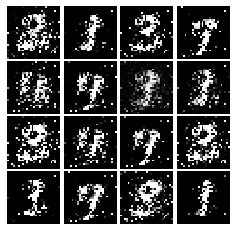

Epoch: 2, Iter: 960, D: 0.09732, G:0.4238


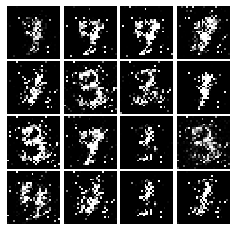

Epoch: 2, Iter: 980, D: 0.1124, G:0.1691


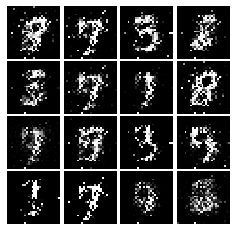

Epoch: 2, Iter: 1000, D: 0.1511, G:0.4718


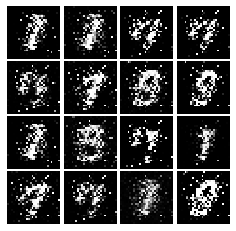

Epoch: 2, Iter: 1020, D: 0.1224, G:0.5088


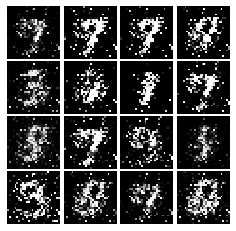

Epoch: 2, Iter: 1040, D: 0.1947, G:0.2699


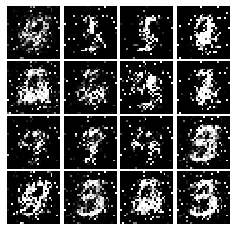

Epoch: 2, Iter: 1060, D: 0.1518, G:0.2225


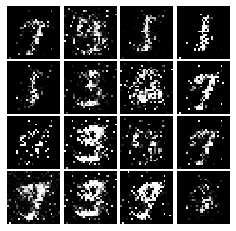

Epoch: 2, Iter: 1080, D: 0.1231, G:0.4672


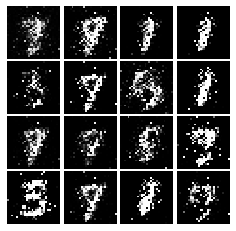

Epoch: 2, Iter: 1100, D: 0.1314, G:0.3029


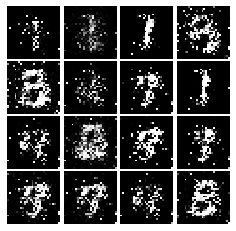

Epoch: 2, Iter: 1120, D: 0.115, G:0.4395


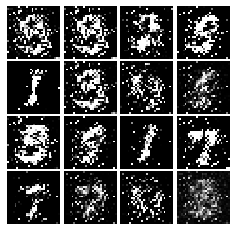

Epoch: 2, Iter: 1140, D: 0.14, G:0.7242


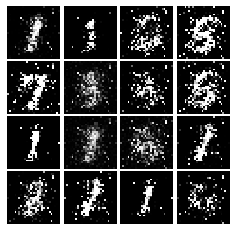

Epoch: 2, Iter: 1160, D: 0.1476, G:0.3164


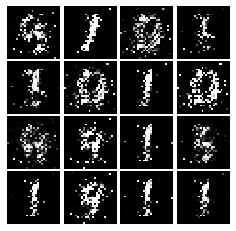

Epoch: 2, Iter: 1180, D: 0.1664, G:0.2611


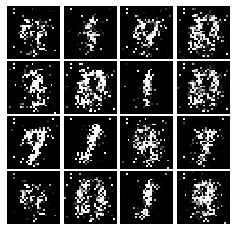

Epoch: 2, Iter: 1200, D: 0.1449, G:0.2187


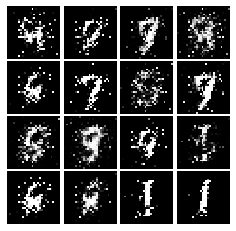

Epoch: 2, Iter: 1220, D: 0.1463, G:0.2803


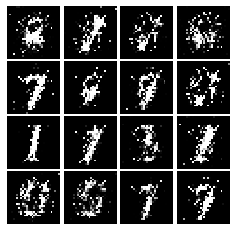

Epoch: 2, Iter: 1240, D: 0.1729, G:0.433


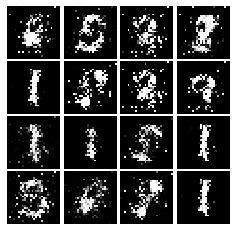

Epoch: 2, Iter: 1260, D: 0.1462, G:0.2451


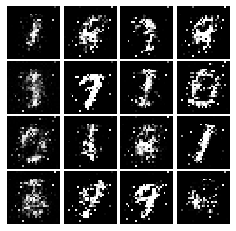

Epoch: 2, Iter: 1280, D: 0.1687, G:0.235


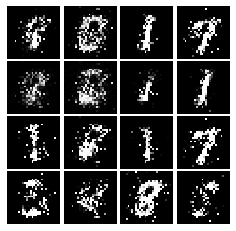

Epoch: 2, Iter: 1300, D: 0.1517, G:0.4016


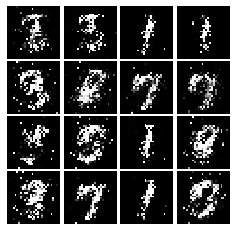

Epoch: 2, Iter: 1320, D: 0.1869, G:0.2588


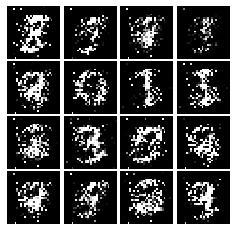

Epoch: 2, Iter: 1340, D: 0.1582, G:0.3683


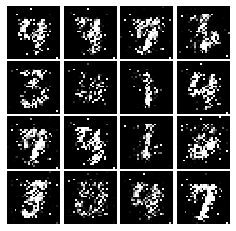

Epoch: 2, Iter: 1360, D: 0.1465, G:0.2725


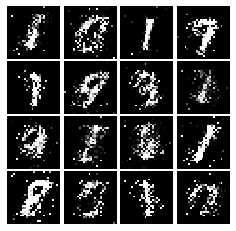

Epoch: 2, Iter: 1380, D: 0.1479, G:0.318


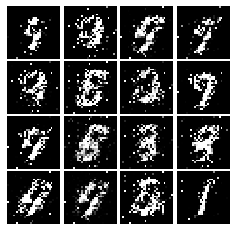

Epoch: 2, Iter: 1400, D: 0.1325, G:0.6027


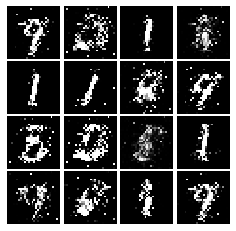

Epoch: 3, Iter: 1420, D: 0.1727, G:0.31


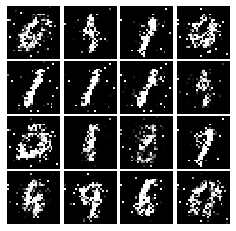

Epoch: 3, Iter: 1440, D: 0.1538, G:0.3411


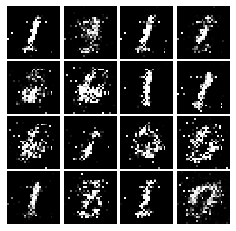

Epoch: 3, Iter: 1460, D: 0.1848, G:0.2839


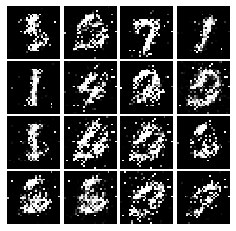

Epoch: 3, Iter: 1480, D: 0.1638, G:0.2996


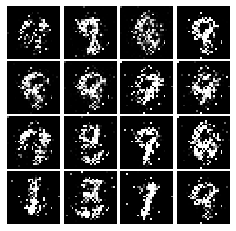

Epoch: 3, Iter: 1500, D: 0.2067, G:1.052


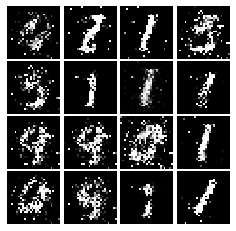

Epoch: 3, Iter: 1520, D: 0.1821, G:0.2237


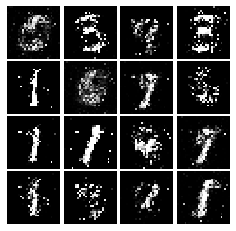

Epoch: 3, Iter: 1540, D: 0.1755, G:0.2446


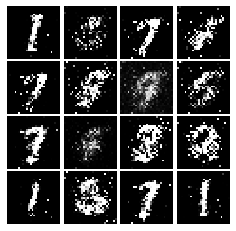

Epoch: 3, Iter: 1560, D: 0.1584, G:0.2429


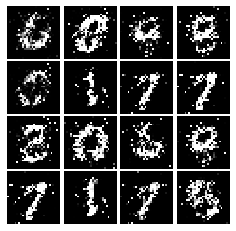

Epoch: 3, Iter: 1580, D: 0.1744, G:0.2875


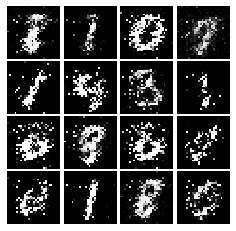

Epoch: 3, Iter: 1600, D: 0.4485, G:0.2756


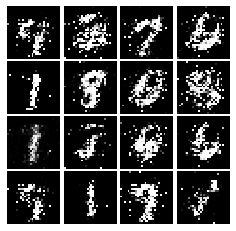

Epoch: 3, Iter: 1620, D: 0.1884, G:0.2577


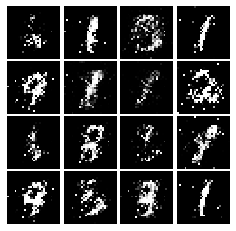

Epoch: 3, Iter: 1640, D: 0.2075, G:0.1957


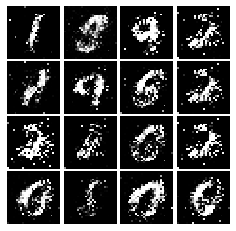

Epoch: 3, Iter: 1660, D: 0.2171, G:0.2031


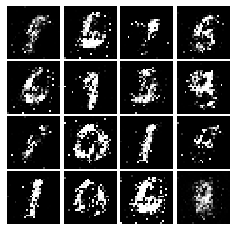

Epoch: 3, Iter: 1680, D: 0.1993, G:0.2365


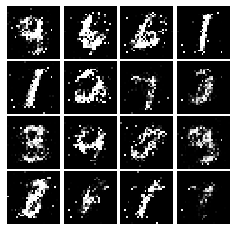

Epoch: 3, Iter: 1700, D: 0.207, G:0.2107


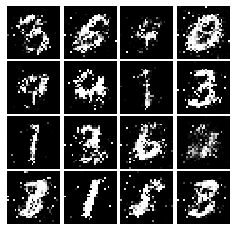

Epoch: 3, Iter: 1720, D: 0.2194, G:0.2475


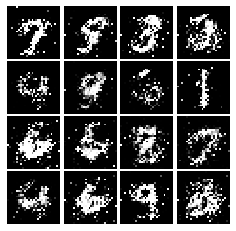

Epoch: 3, Iter: 1740, D: 0.2019, G:0.2409


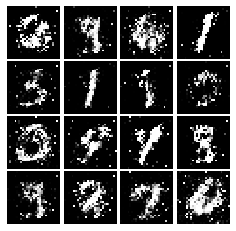

Epoch: 3, Iter: 1760, D: 0.2913, G:0.2472


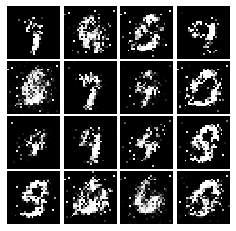

Epoch: 3, Iter: 1780, D: 0.1813, G:0.1934


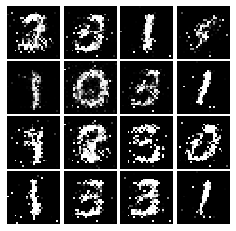

Epoch: 3, Iter: 1800, D: 0.2107, G:0.1901


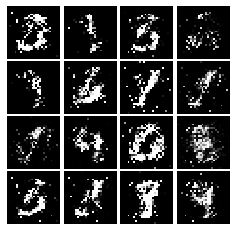

Epoch: 3, Iter: 1820, D: 0.2381, G:0.1956


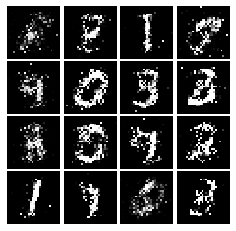

Epoch: 3, Iter: 1840, D: 0.2227, G:0.243


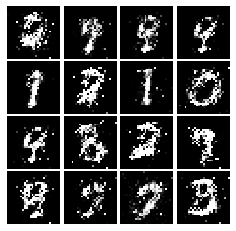

Epoch: 3, Iter: 1860, D: 0.1962, G:0.2814


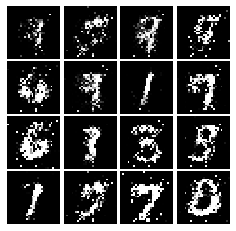

Epoch: 4, Iter: 1880, D: 0.1946, G:0.2377


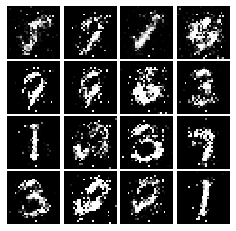

Epoch: 4, Iter: 1900, D: 0.1916, G:0.2284


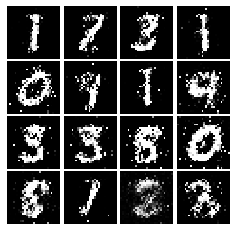

Epoch: 4, Iter: 1920, D: 0.2394, G:0.2559


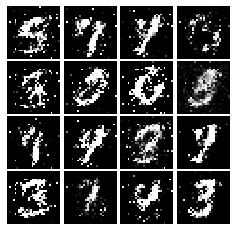

Epoch: 4, Iter: 1940, D: 0.1688, G:0.2436


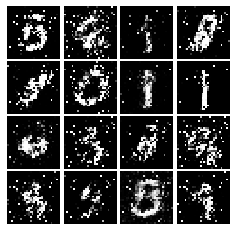

Epoch: 4, Iter: 1960, D: 0.2017, G:0.1948


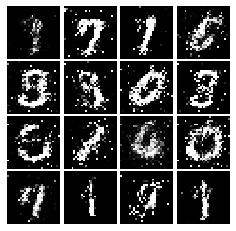

Epoch: 4, Iter: 1980, D: 0.1836, G:0.2447


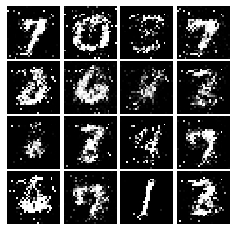

Epoch: 4, Iter: 2000, D: 0.2269, G:0.1976


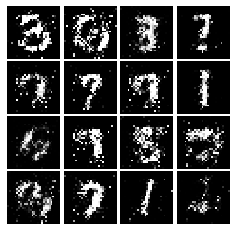

Epoch: 4, Iter: 2020, D: 0.2204, G:0.2304


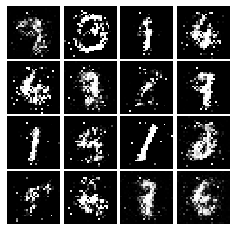

Epoch: 4, Iter: 2040, D: 0.2211, G:0.2093


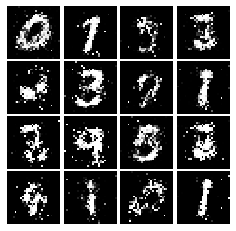

Epoch: 4, Iter: 2060, D: 0.2209, G:0.2119


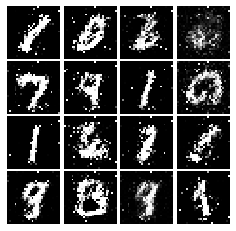

Epoch: 4, Iter: 2080, D: 0.2003, G:0.1878


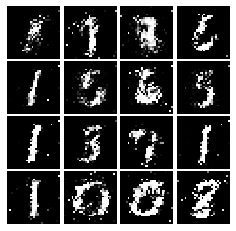

Epoch: 4, Iter: 2100, D: 0.1863, G:0.2084


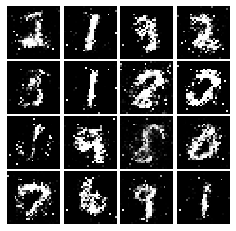

Epoch: 4, Iter: 2120, D: 0.2071, G:0.2269


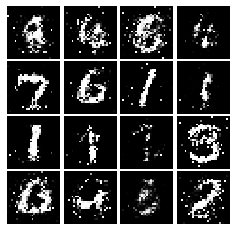

Epoch: 4, Iter: 2140, D: 0.2213, G:0.1827


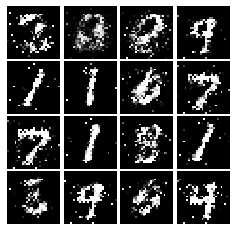

Epoch: 4, Iter: 2160, D: 0.2246, G:0.1883


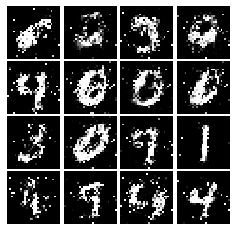

Epoch: 4, Iter: 2180, D: 0.2197, G:0.1901


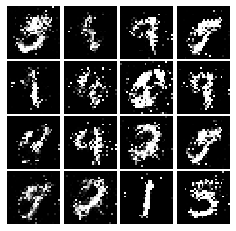

Epoch: 4, Iter: 2200, D: 0.2044, G:0.2106


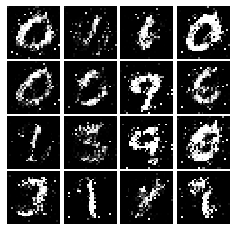

Epoch: 4, Iter: 2220, D: 0.2052, G:0.2159


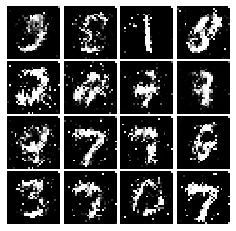

Epoch: 4, Iter: 2240, D: 0.2197, G:0.1782


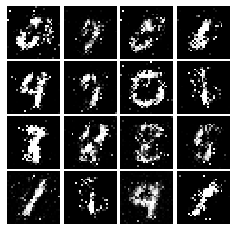

Epoch: 4, Iter: 2260, D: 0.212, G:0.1764


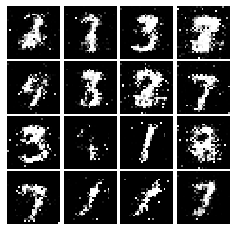

Epoch: 4, Iter: 2280, D: 0.237, G:0.2119


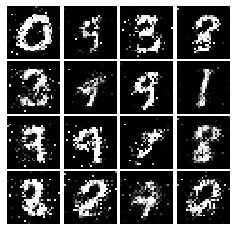

Epoch: 4, Iter: 2300, D: 0.2202, G:0.1898


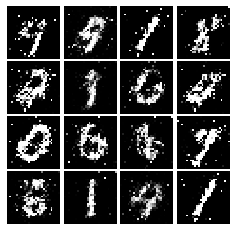

Epoch: 4, Iter: 2320, D: 0.1904, G:0.1923


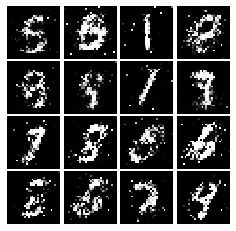

Epoch: 4, Iter: 2340, D: 0.1914, G:0.2172


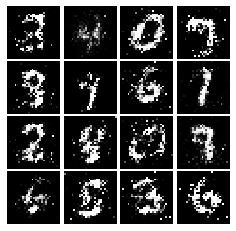

Epoch: 5, Iter: 2360, D: 0.2129, G:0.1842


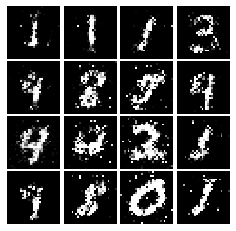

Epoch: 5, Iter: 2380, D: 0.2053, G:0.1971


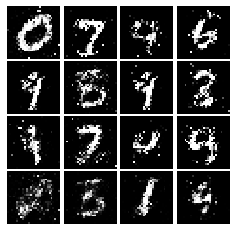

Epoch: 5, Iter: 2400, D: 0.2032, G:0.2106


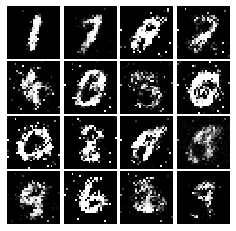

Epoch: 5, Iter: 2420, D: 0.222, G:0.213


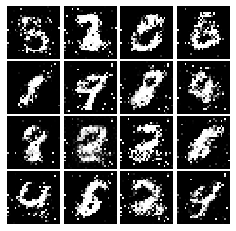

Epoch: 5, Iter: 2440, D: 0.2054, G:0.182


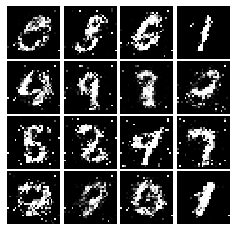

Epoch: 5, Iter: 2460, D: 0.1859, G:0.2229


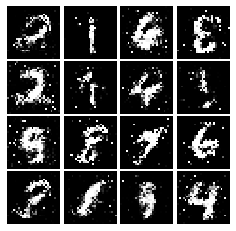

Epoch: 5, Iter: 2480, D: 0.2132, G:0.161


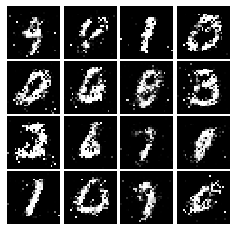

Epoch: 5, Iter: 2500, D: 0.2013, G:0.2496


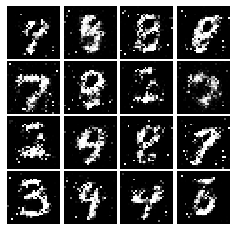

Epoch: 5, Iter: 2520, D: 0.2138, G:0.1586


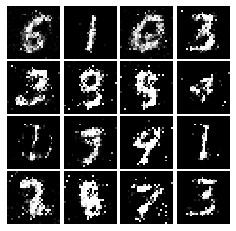

Epoch: 5, Iter: 2540, D: 0.2094, G:0.195


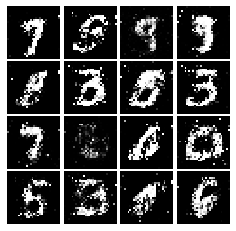

Epoch: 5, Iter: 2560, D: 0.2097, G:0.1965


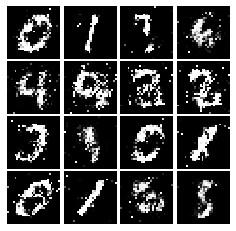

Epoch: 5, Iter: 2580, D: 0.2216, G:0.2222


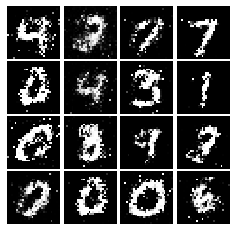

Epoch: 5, Iter: 2600, D: 0.2342, G:0.148


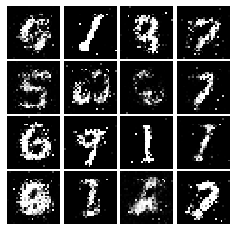

Epoch: 5, Iter: 2620, D: 0.2067, G:0.2061


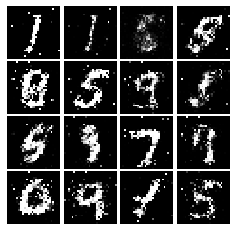

Epoch: 5, Iter: 2640, D: 0.2229, G:0.1952


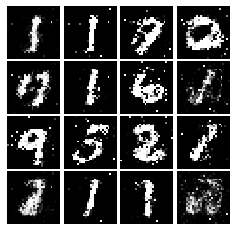

Epoch: 5, Iter: 2660, D: 0.2097, G:0.1947


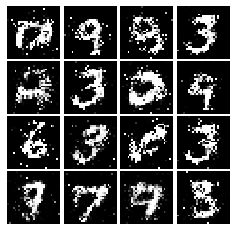

Epoch: 5, Iter: 2680, D: 0.2382, G:0.1787


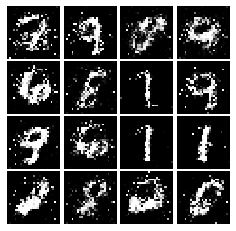

Epoch: 5, Iter: 2700, D: 0.2392, G:0.1953


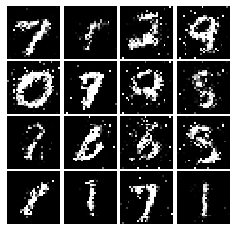

Epoch: 5, Iter: 2720, D: 0.2401, G:0.178


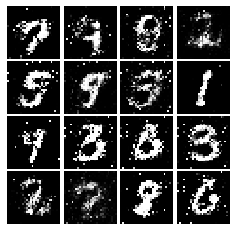

Epoch: 5, Iter: 2740, D: 0.2251, G:0.1889


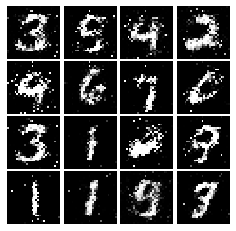

Epoch: 5, Iter: 2760, D: 0.2058, G:0.191


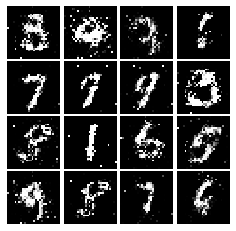

Epoch: 5, Iter: 2780, D: 0.218, G:0.197


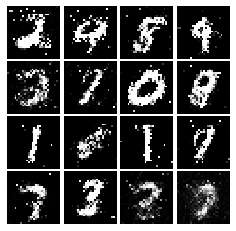

Epoch: 5, Iter: 2800, D: 0.2395, G:0.2008


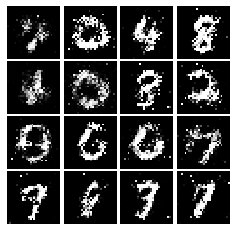

Epoch: 6, Iter: 2820, D: 0.2216, G:0.207


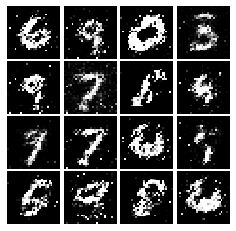

Epoch: 6, Iter: 2840, D: 0.2077, G:0.1889


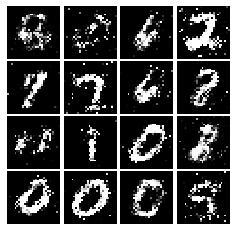

Epoch: 6, Iter: 2860, D: 0.2017, G:0.2073


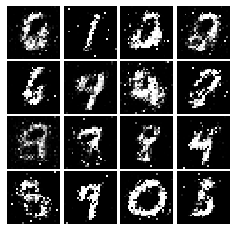

Epoch: 6, Iter: 2880, D: 0.2085, G:0.24


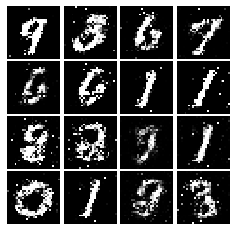

Epoch: 6, Iter: 2900, D: 0.2343, G:0.1869


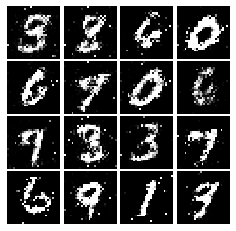

Epoch: 6, Iter: 2920, D: 0.2281, G:0.1791


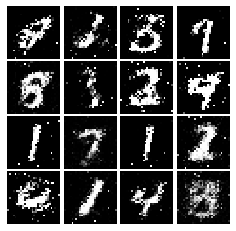

Epoch: 6, Iter: 2940, D: 0.2101, G:0.1756


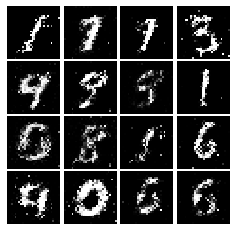

Epoch: 6, Iter: 2960, D: 0.204, G:0.1832


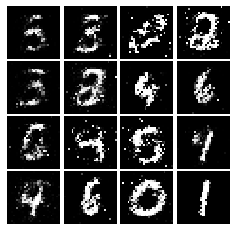

Epoch: 6, Iter: 2980, D: 0.2085, G:0.1694


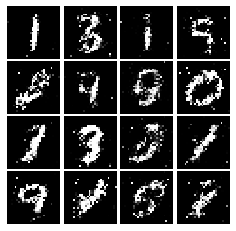

Epoch: 6, Iter: 3000, D: 0.1888, G:0.2852


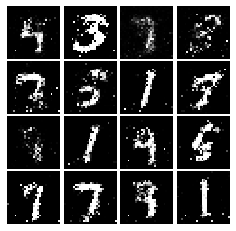

Epoch: 6, Iter: 3020, D: 0.2224, G:0.2014


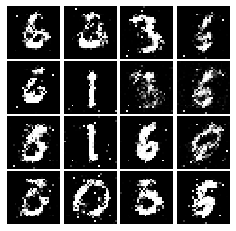

Epoch: 6, Iter: 3040, D: 0.2252, G:0.152


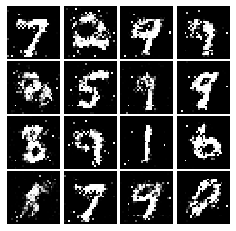

Epoch: 6, Iter: 3060, D: 0.2284, G:0.1668


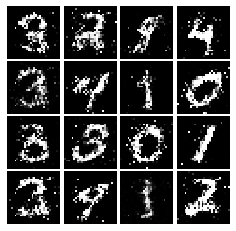

Epoch: 6, Iter: 3080, D: 0.2203, G:0.1795


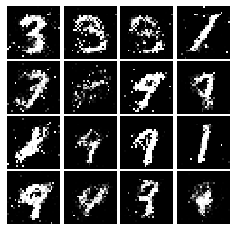

Epoch: 6, Iter: 3100, D: 0.2336, G:0.1685


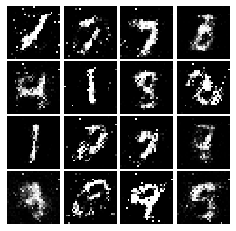

Epoch: 6, Iter: 3120, D: 0.247, G:0.1427


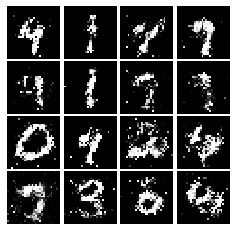

Epoch: 6, Iter: 3140, D: 0.2446, G:0.1471


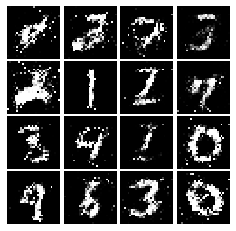

Epoch: 6, Iter: 3160, D: 0.2133, G:0.1856


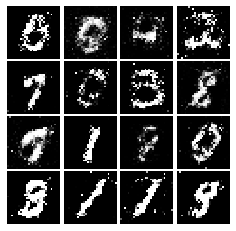

Epoch: 6, Iter: 3180, D: 0.2453, G:0.169


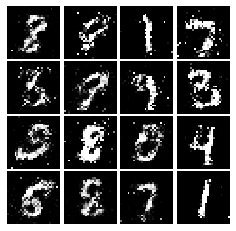

Epoch: 6, Iter: 3200, D: 0.2303, G:0.1922


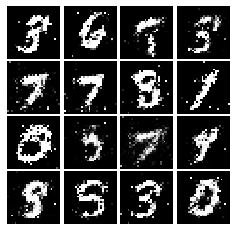

Epoch: 6, Iter: 3220, D: 0.2219, G:0.1827


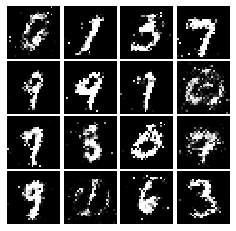

Epoch: 6, Iter: 3240, D: 0.2169, G:0.1745


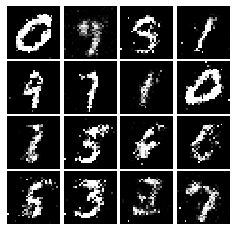

Epoch: 6, Iter: 3260, D: 0.2253, G:0.1754


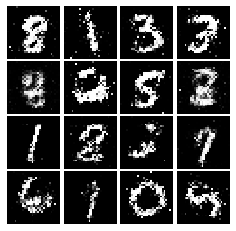

Epoch: 6, Iter: 3280, D: 0.2102, G:0.1928


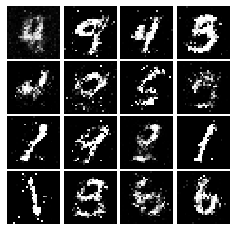

Epoch: 7, Iter: 3300, D: 0.2027, G:0.1765


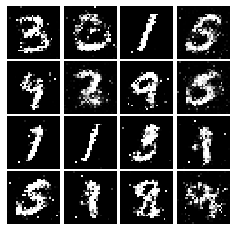

Epoch: 7, Iter: 3320, D: 0.2218, G:0.1639


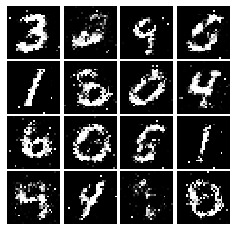

Epoch: 7, Iter: 3340, D: 0.2141, G:0.1549


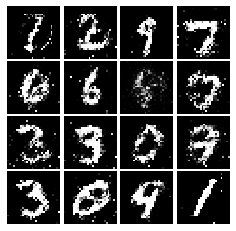

Epoch: 7, Iter: 3360, D: 0.2499, G:0.1603


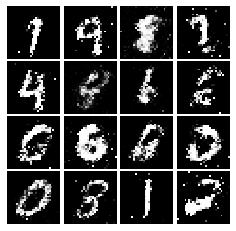

Epoch: 7, Iter: 3380, D: 0.2618, G:0.174


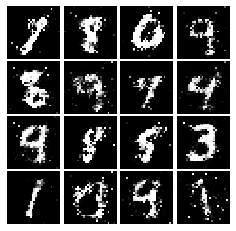

Epoch: 7, Iter: 3400, D: 0.2231, G:0.189


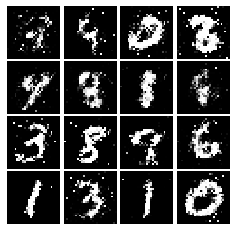

Epoch: 7, Iter: 3420, D: 0.2366, G:0.1781


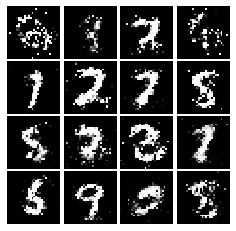

Epoch: 7, Iter: 3440, D: 0.2121, G:0.1788


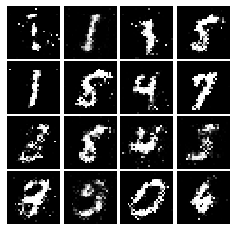

Epoch: 7, Iter: 3460, D: 0.2099, G:0.1604


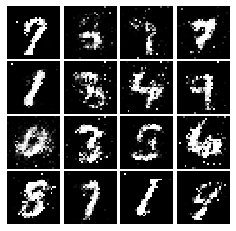

Epoch: 7, Iter: 3480, D: 0.22, G:0.1705


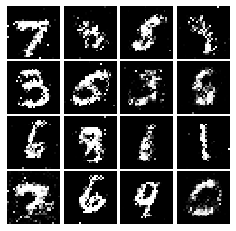

Epoch: 7, Iter: 3500, D: 0.2194, G:0.16


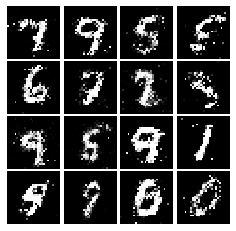

Epoch: 7, Iter: 3520, D: 0.241, G:0.1807


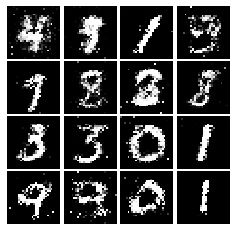

Epoch: 7, Iter: 3540, D: 0.2031, G:0.1864


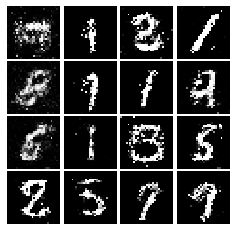

Epoch: 7, Iter: 3560, D: 0.249, G:0.2513


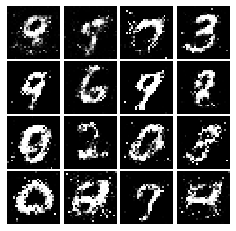

Epoch: 7, Iter: 3580, D: 0.2277, G:0.1901


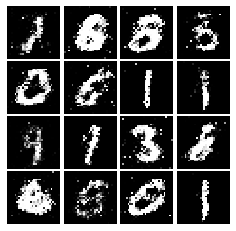

Epoch: 7, Iter: 3600, D: 0.2075, G:0.1701


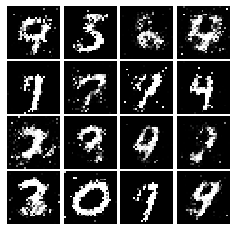

Epoch: 7, Iter: 3620, D: 0.227, G:0.1642


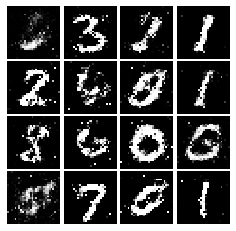

Epoch: 7, Iter: 3640, D: 0.2172, G:0.1698


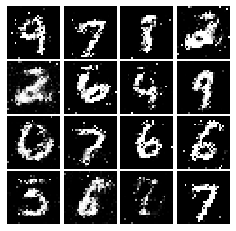

Epoch: 7, Iter: 3660, D: 0.2319, G:0.1693


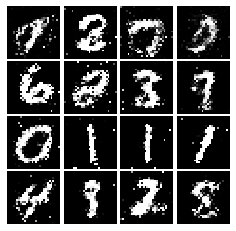

Epoch: 7, Iter: 3680, D: 0.2149, G:0.1547


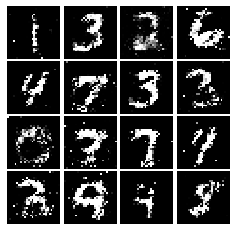

Epoch: 7, Iter: 3700, D: 0.2257, G:0.1768


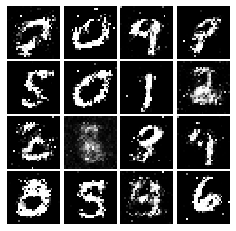

Epoch: 7, Iter: 3720, D: 0.2284, G:0.1423


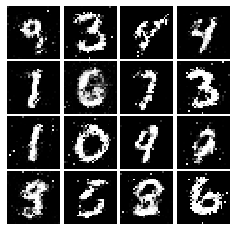

Epoch: 7, Iter: 3740, D: 0.2443, G:0.1609


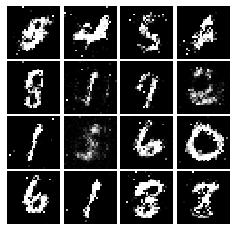

Epoch: 8, Iter: 3760, D: 0.236, G:0.1608


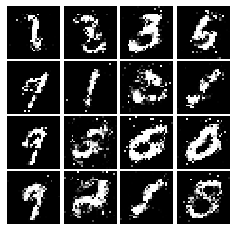

Epoch: 8, Iter: 3780, D: 0.2145, G:0.1466


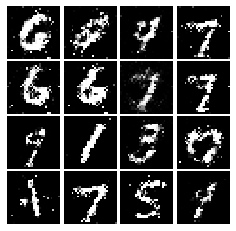

Epoch: 8, Iter: 3800, D: 0.229, G:0.1467


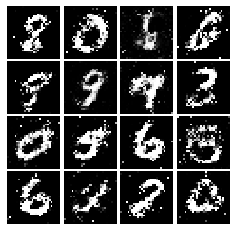

Epoch: 8, Iter: 3820, D: 0.2629, G:0.1585


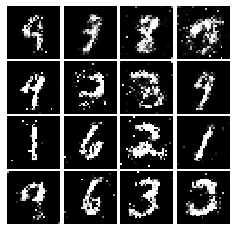

Epoch: 8, Iter: 3840, D: 0.2392, G:0.1388


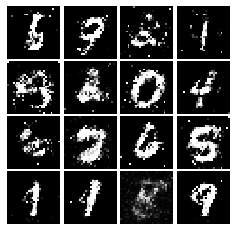

Epoch: 8, Iter: 3860, D: 0.2087, G:0.1617


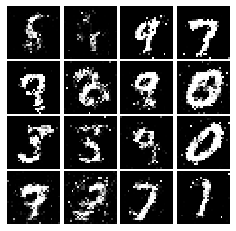

Epoch: 8, Iter: 3880, D: 0.251, G:0.1631


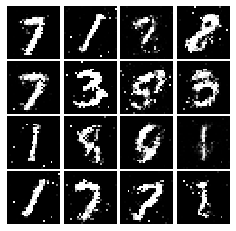

Epoch: 8, Iter: 3900, D: 0.2181, G:0.1738


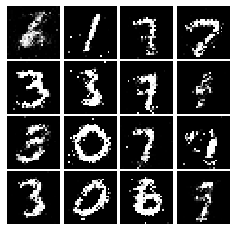

Epoch: 8, Iter: 3920, D: 0.2025, G:0.1597


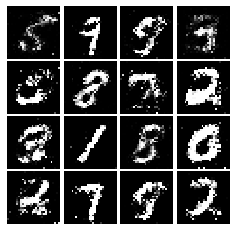

Epoch: 8, Iter: 3940, D: 0.2491, G:0.1444


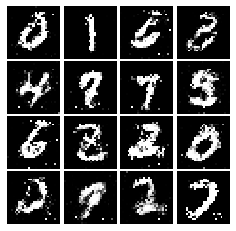

Epoch: 8, Iter: 3960, D: 0.2243, G:0.1645


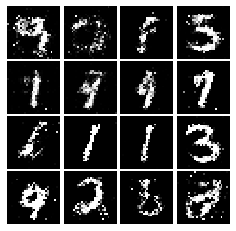

Epoch: 8, Iter: 3980, D: 0.2147, G:0.1573


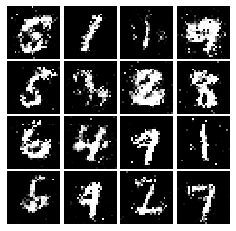

Epoch: 8, Iter: 4000, D: 0.2257, G:0.1808


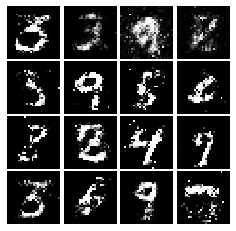

Epoch: 8, Iter: 4020, D: 0.2256, G:0.17


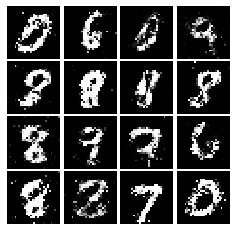

Epoch: 8, Iter: 4040, D: 0.2302, G:0.1841


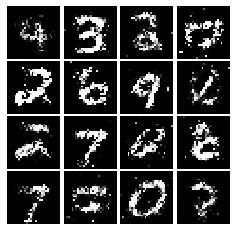

Epoch: 8, Iter: 4060, D: 0.2422, G:0.1507


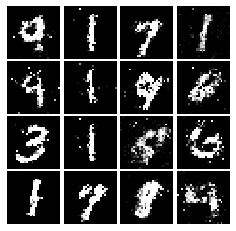

Epoch: 8, Iter: 4080, D: 0.2391, G:0.1749


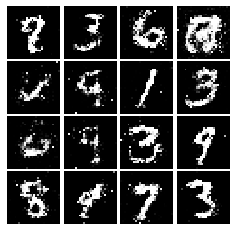

Epoch: 8, Iter: 4100, D: 0.2352, G:0.1677


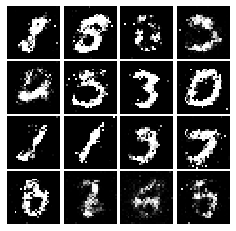

Epoch: 8, Iter: 4120, D: 0.2214, G:0.1834


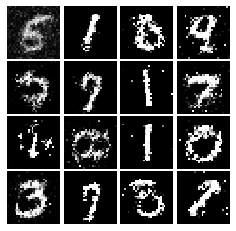

Epoch: 8, Iter: 4140, D: 0.2305, G:0.1806


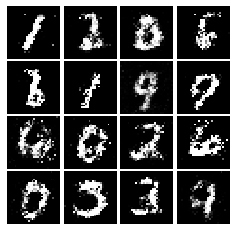

Epoch: 8, Iter: 4160, D: 0.2267, G:0.1923


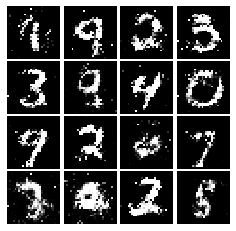

Epoch: 8, Iter: 4180, D: 0.2432, G:0.1529


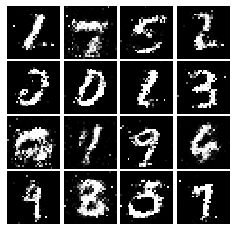

Epoch: 8, Iter: 4200, D: 0.2224, G:0.2046


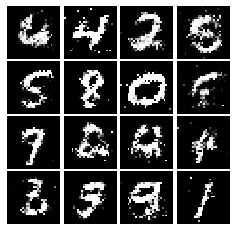

Epoch: 8, Iter: 4220, D: 0.2063, G:0.2269


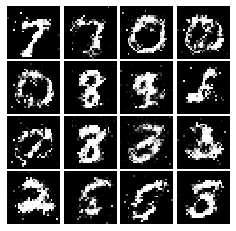

Epoch: 9, Iter: 4240, D: 0.2612, G:0.17


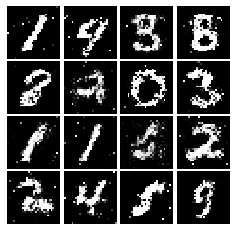

Epoch: 9, Iter: 4260, D: 0.245, G:0.1512


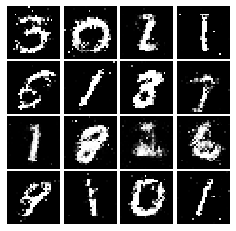

Epoch: 9, Iter: 4280, D: 0.2473, G:0.1836


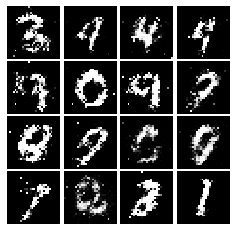

Epoch: 9, Iter: 4300, D: 0.2339, G:0.1588


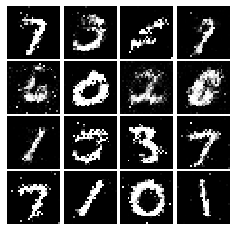

Epoch: 9, Iter: 4320, D: 0.246, G:0.1781


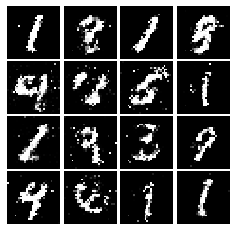

Epoch: 9, Iter: 4340, D: 0.2297, G:0.1712


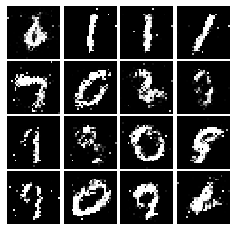

Epoch: 9, Iter: 4360, D: 0.2319, G:0.1584


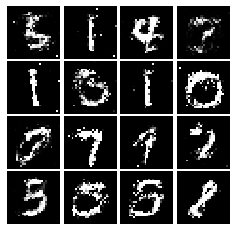

Epoch: 9, Iter: 4380, D: 0.2309, G:0.1766


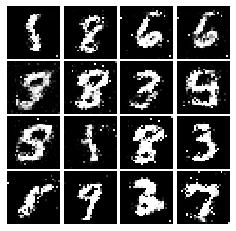

Epoch: 9, Iter: 4400, D: 0.2369, G:0.1867


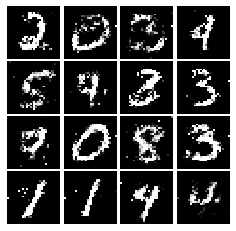

Epoch: 9, Iter: 4420, D: 0.2255, G:0.1777


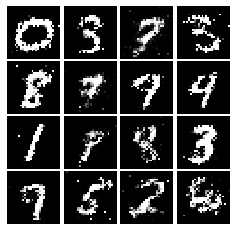

Epoch: 9, Iter: 4440, D: 0.2321, G:0.1588


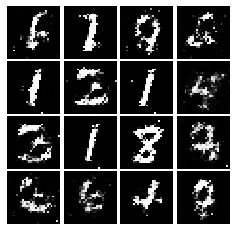

Epoch: 9, Iter: 4460, D: 0.2595, G:0.1824


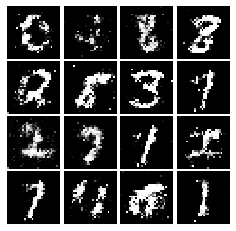

Epoch: 9, Iter: 4480, D: 0.2267, G:0.1594


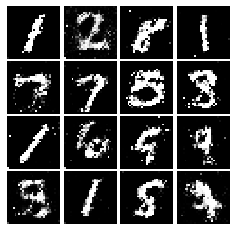

Epoch: 9, Iter: 4500, D: 0.2459, G:0.1802


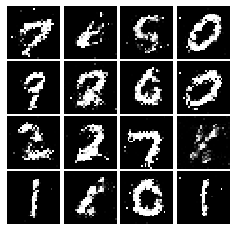

Epoch: 9, Iter: 4520, D: 0.2328, G:0.1833


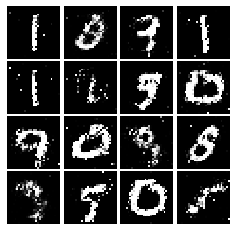

Epoch: 9, Iter: 4540, D: 0.2385, G:0.1581


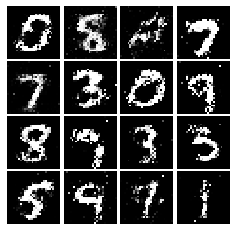

Epoch: 9, Iter: 4560, D: 0.2407, G:0.1881


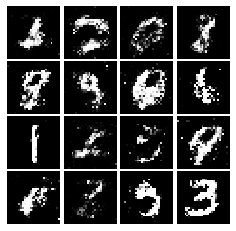

Epoch: 9, Iter: 4580, D: 0.2416, G:0.1737


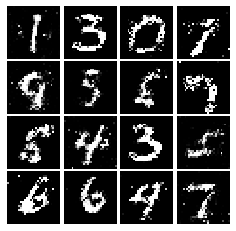

Epoch: 9, Iter: 4600, D: 0.2572, G:0.1504


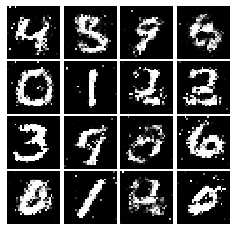

Epoch: 9, Iter: 4620, D: 0.226, G:0.1662


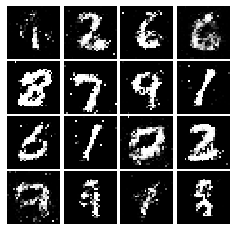

Epoch: 9, Iter: 4640, D: 0.2186, G:0.1526


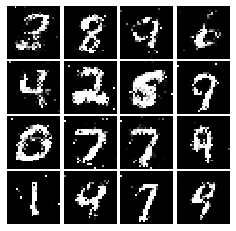

Epoch: 9, Iter: 4660, D: 0.2225, G:0.1576


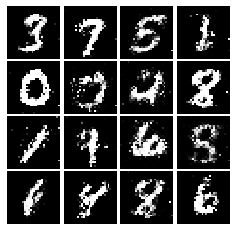

Epoch: 9, Iter: 4680, D: 0.2329, G:0.1457


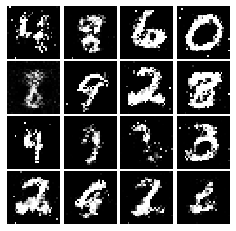

Final images


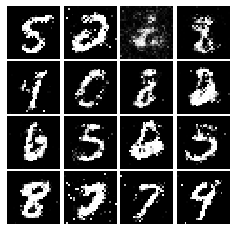

In [85]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [97]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, kernel_size=(5, 5), strides=(1, 1), padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2)),
        tf.keras.layers.Conv2D(64, kernel_size=(5, 5), strides=(1, 1), padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, input_shape=(4 * 4 * 64,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1, input_shape=(4 * 4 * 64,))
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model.add(tf.keras.layers.Dense(1024, input_shape=(noise_dim, ), activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
